# CONTEXTE

Mission - Segmentez des clients d'un site e-commerce


Comment allez vous procéder ?
Barres titres

 

Cette mission suit un scénario de projet professionnel.


Vous pouvez suivre les étapes pour vous aider à réaliser vos livrables.

 

Avant de démarrer, nous vous conseillons de :

lire toute la mission et ses documents liés ;
prendre des notes sur ce que vous avez compris ;
consulter les étapes pour vous guider ; 
préparer une liste de questions pour votre première session de mentorat.
 

Prêt à mener la mission ?
Barres titres

 

Vous êtes consultant pour Olist, une entreprise brésilienne qui propose une solution de vente sur les marketplaces en ligne.

 

La page d'accueil du site Olist
Votre rôle est d’accompagner Olist dans leur projet de monter une équipe Data et leur premier cas d’usage Data Science autour de la segmentation client.

 

Vous venez de rejoindre Olist dans un contexte de recrutement intensif afin de monter leur équipe Data. En effet, ils font d’abord appel à des consultants comme vous en renfort sur les sujets les plus critiques en attendant d'internaliser les compétences. Avant de réaliser la segmentation client, on vous attribue une première mission pour aider Fernanda, Lead Data Analyst chez Olist. 

 

De : Fernanda

A : Moi

Objet : dashboard Customer Experience

Bonjour,

 

Bienvenue chez Olist ! Nous sommes ravis d’avoir du soutien en cette période de mise en place de notre écosystème Data.

 

A ce sujet d’ailleurs, l’un de nos projets Data phares du moment est la construction et la maintenance de notre Dashboard au service des équipes Customer Experience. Nous y exposons les KPIs essentiels pour que les équipes puissent avoir de la visibilité sur les états, les villes, ou les vendeurs qui nécessitent un suivi de près de la part de notre service client.

 

Nous sommes en train d’alimenter les résultats de ce Dashboard avec des requêtes qui interrogent la base de données SQL à laquelle tu as accès.

 

C’est sur l’implémentation de certaines requêtes urgentes que tu peux nous filer un coup de main le temps qu’un nouveau Data Analyst rejoigne l’équipe pour prendre le relais.

 

Je mets en PJ la liste de requêtes SQL que nous avons besoin d’intégrer au Dashboard. 

 

Cordialement,

Fernanda

Lead Data Analyst chez Olist

Pieces jointes:

Liste de requêtes SQL
Après avoir étudié les éléments partagés par Fernanda vous vous mettez au travail.

 

Quelques jours plus tard
Barres titres

 

Cette urgence résolue, vous pouvez enfin passer à votre mission principale : Olist souhaite que vous fournissiez à ses équipes d'e-commerce une segmentation des clients qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.

 

Votre objectif est de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.

 

Vous devrez fournir à l’équipe Marketing une description actionable de votre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu’une proposition de contrat de maintenance basée sur une analyse de la stabilité des segments au cours du temps.

 

Les données
Pour cette mission, Olist vous fournit une base de données anonymisée comportant des informations sur l’historique des commandes, les produits achetés, les commentaires de satisfaction, et la localisation des clients depuis janvier 2017.

 

Vous devez aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Vous utiliserez donc des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.

 

Vous créez donc un notebook et démarrez votre travail d’analyse exploratoire.

 
3 jours plus tard
Barres titres

 

Après quelques premières analyses, vous vous rendez compte qu'Olist ne vous a pas fourni beaucoup de données ; vous enquêtez donc auprès de l'entreprise pour obtenir quelques informations complémentaires, et vérifier que vous avez bien compris la mission.

 

Voici sa réponse :


De : João

A : Moi

Objet : re : segmentation des clients

Bonjour, 

 

Nous sommes confiants sur le fait que les données à disposition suffiront pour réaliser un premier clustering. Cela a déjà été fait par d’autres prestataires par le passé, avec encore moins de données.

 

La segmentation proposée doit être exploitable et facile d’utilisation par notre équipe Marketing. Elle doit au minimum pouvoir différencier les bons et moins bons clients en termes de commandes et de satisfaction. Nous attendons bien sûr une segmentation sur l’ensemble des clients.

 

Dans un deuxième temps, une fois le modèle de segmentation choisi, nous souhaiterions que vous nous fassiez une recommandation de fréquence à laquelle la segmentation doit être mise à jour pour rester pertinente, afin de pouvoir effectuer un devis de contrat de maintenance.


Pour information, le code fourni doit respecter la convention PEP8, pour être utilisable par Olist.

 

À titre d'exemple, je joins à cet e-mail la segmentation RFM réalisée par votre prédécesseur il y a quelques années. Mais c’est uniquement à titre d’exemple, j'attends un travail plus approfondi de votre part dans le cadre de ce projet (i.e. RFM, satisfaction et autres possibilités).

 

Bien à vous,

João de l’équipe Marketing

Pièce-jointe :

Schéma RFM, comparant récence, fréquence et montant et classant les clients en groupes.


Vous réalisez trois autres documents afin de préparer une réponse à Olist : 

Un notebook avec des essais des différentes approches de modélisation 
Un notebook de simulation pour déterminer la fréquence nécessaire de mise à jour du modèle de segmentation, afin que celui-ci reste pertinent 
Une présentation pour un collègue afin d’obtenir ses retours sur votre approche
 

C’est parti pour cette dernière ligne droite ! 

 

 

# LIVRABLES

* Un script avec l’ensemble des requêtes SQL demandées par Fernanda
* Un notebook de l'analyse exploratoire (non cleané, pour comprendre votre démarche)
* Un notebook (ou code commenté au choix) d’essais des différentes approches de modélisation (non cleané, pour comprendre votre démarche)
* Un notebook de simulation pour déterminer la fréquence nécessaire de mise à jour du modèle de segmentation
* Un support de présentation pour présenter votre travail à un collègue

# IMPORTS

In [2]:
# data & science
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score
import category_encoders as ce
# graphiques
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
# system & tools
import sqlite3
from datetime import datetime, timedelta
from importlib import reload
import warnings
import locale
import time
# warnings.filterwarnings('ignore')
#import sys
#sys.path.insert(0, '/Users/stephanieduhem/Documents/MASTER_AI_ENGINEER/openclassroom/tools')
#import functions as fct


# FONCTIONS

In [3]:
##### FONCTION POUR GÉNÉRER UN DF RÉCAPITULATIF DES NAN DANS CHAQUE COLONNE
def taux_nan(dataframe) :
    # RÉCUPÉRER LE NOMBRE TOTAL DE DONNÉES
    total_data = dataframe.size
    # RÉCUPÉRER LE NOMBRE TOTAL DE VALEURS MANQUANTES
    total_nan = dataframe.isna().sum().sum()
    # CALCULER LE POURCENTAGE TOTAL DE VALEURS MANQUANTES
    taux_nan = (total_nan / total_data) * 100
    print(f'Le dataframe sélectionné contient {round(taux_nan, 2)} % de valeurs manquantes')
    

##### FONCTION POUR GÉNÉRER UN DF RÉCAPITULATIF DES NAN DANS CHAQUE COLONNE
def recap_nan(dataframe) :
    
    # RÉCUPÉRER LE DÉCOMPTE DE NAN 
    recap_nan = {}
    list_50_percent = []
    list_0_nan = []
    for column in dataframe.columns :
        if dataframe[column].isnull().sum() == 0 :
                    list_0_nan.append(column)
        if dataframe[column].isnull().sum() != 0 :
            recap_nan[column] = dataframe[column].isnull().sum()
            if dataframe[column].isnull().sum() >= (len(dataframe)/2) :
                list_50_percent.append(column)
    
    if len(list_0_nan) == len(dataframe.columns)  :
        print ("Le dataframe sélectionné a " + str(dataframe.shape[1]) + " colonnes et " + str(dataframe.shape[0]) + " lignes.\n" 
           "* Il n'y a aucune colonne contenant des valeurs manquantes.")
    else :
        # VISUALISATION DANS UN DATAFRAME
        df_recap_nan = pd.DataFrame.from_dict(recap_nan, orient = 'index' )
        df_recap_nan = df_recap_nan.rename(columns={0:'decompte_NaN'})
        df_recap_nan['Taux_valeur_manquantes_%'] = (df_recap_nan['decompte_NaN'] / len(dataframe) * 100)
        df_recap_nan = df_recap_nan.sort_values('Taux_valeur_manquantes_%', ascending=True).reset_index()
        df_recap_nan = df_recap_nan.rename(columns={'index' : 'col_names'})
        
        print ("Le dataframe sélectionné a " + str(dataframe.shape[1]) + " colonnes et " + str(dataframe.shape[0]) + " lignes.\n" 
            "* Il y a " + str(len(list_0_nan)) + " colonnes sans aucune valeur manquante.\n"     
                "* Il y a " + str(df_recap_nan.shape[0]) + " colonnes avec des valeurs manquantes.\n"
                "* Parmi ces " + str(df_recap_nan.shape[0]) + " colonnes, il y a " + str(len(list_50_percent)) + " colonnes avec au moins 50% de valeurs manquantes.")
        return df_recap_nan


##### FONCTION GRAPHIQUE BASÉE SUR RECAP_NAN
def graph_nan(dataframe) :
    
    font= {'color':  'black', 'weight': 'bold', 'size': 15 }
    fig = plt.figure(
        #figsize=(18, 16)
        )
    sns.barplot(x="Taux_valeur_manquantes_%", y="col_names", data=dataframe, palette="crest")
    #Seuil 50% de taux de remplissage
    plt.axvline(x=50, linewidth=2, color = 'r')
    plt.axvline(x=100, linewidth=2, color = 'r')
    plt.text(50+2, 5, "Seuil 50% de taux de valeurs manquantes", fontdict= font)
    plt.title("Taux de valeurs manquantes des variables (%)", fontdict=font)
    plt.show()



# RÉCUPÉRATION DES DONNÉES

In [5]:
# Connexion à la base de données SQLite
conn = sqlite3.connect('./olist.db')
cursor = conn.cursor()

query = """
select 
    customers.customer_id,
    customers.customer_unique_id,
    customers.customer_zip_code_prefix,
    customers.customer_city,
    customers.customer_state,
    orders.order_id,
    orders.order_status,
    orders.order_purchase_timestamp,
    orders.order_approved_at,
    orders.order_delivered_customer_date,
    orders.order_estimated_delivery_date,
    order_items.order_item_id,
    order_items.product_id,
    translation.product_category_name_english,
    products.product_description_lenght,
    products.product_name_lenght,
    products.product_weight_g,
    order_items.seller_id,
    sellers.seller_zip_code_prefix,
    sellers.seller_city,
    sellers.seller_state,
    order_items.shipping_limit_date,
    order_items.price,
    order_items.freight_value,
    order_pymts.payment_sequential,
    order_pymts.payment_type,
    order_pymts.payment_installments,
    order_pymts.payment_value,
    order_reviews.review_score,
    order_reviews.review_comment_title,
    order_reviews.review_comment_message,
    order_reviews.review_creation_date,
    order_reviews.review_answer_timestamp
from 
    customers
    right join orders on customers.customer_id = orders.customer_id
    left join order_items on orders.order_id = order_items.order_id
    left join order_reviews on order_items.order_id = order_reviews.order_id
    left join order_pymts on order_items.order_id = order_pymts.order_id
    left join products on order_items.product_id = products.product_id
    left join translation on products.product_category_name = translation.product_category_name
    left join sellers on order_items.seller_id = sellers.seller_id;
"""


cursor.execute(query)
data = cursor.fetchall()

columns = ['customer_id', 'customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state', 'order_id', 'order_status', 'order_purchase_timestamp',
           'order_approved_at', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'order_item_id', 'product_id', 'product_category_name_english',
           'product_description_lenght', 'product_name_lenght', 'product_weight_g', 'seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state',
           'shipping_limit_date', 'price', 'freight_value', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value', 'review_score',
           'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp']
fichier_client_commande = pd.DataFrame(data, columns=columns)

conn.close()

try:
    fichier_client_commande.to_csv('./fichier_client_commande_2.csv', index=False)
    print("Le DataFrame a été enregistré avec succès.")
except Exception as e:
    print(f"Une erreur est survenue lors de l'enregistrement : {e}")

In [ ]:
#  DATA
data = pd.read_csv('./fichier_client_commande_2.csv')
data.info()
display(data.tail())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119085 entries, 0 to 119084
Data columns (total 33 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    119085 non-null  object 
 1   customer_unique_id             119085 non-null  object 
 2   customer_zip_code_prefix       119085 non-null  int64  
 3   customer_city                  119085 non-null  object 
 4   customer_state                 119085 non-null  object 
 5   order_id                       119085 non-null  object 
 6   order_status                   119085 non-null  object 
 7   order_purchase_timestamp       119085 non-null  object 
 8   order_approved_at              118924 non-null  object 
 9   order_delivered_customer_date  115722 non-null  object 
 10  order_estimated_delivery_date  119085 non-null  object 
 11  order_item_id                  118310 non-null  float64
 12  product_id                    

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,...,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
119080,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-13 20:06:37,...,13.88,1.0,credit_card,6.0,88.78,4.0,Recomendo,NaN,2018-04-14 00:00:00,2018-04-28 11:15:04
119081,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,delivered,2018-04-04 08:20:22,2018-04-04 08:35:12,2018-04-11 18:54:45,...,14.16,1.0,credit_card,3.0,129.06,5.0,NaN,NaN,2018-04-12 00:00:00,2018-04-16 10:36:05
119082,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,delivered,2018-04-08 20:11:50,2018-04-08 20:30:03,2018-05-09 19:03:15,...,19.04,1.0,credit_card,5.0,56.04,1.0,Chateada,Esperava qualidade no atendimento e estou tend...,2018-05-04 00:00:00,2018-05-08 01:41:07
119083,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,delivered,2017-11-03 21:08:33,2017-11-03 21:31:20,2017-11-16 19:58:39,...,22.07,1.0,credit_card,2.0,711.07,5.0,NaN,NaN,2017-11-17 00:00:00,2017-11-19 23:34:18
119084,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP,28db69209a75e59f20ccbb5c36a20b90,delivered,2017-12-19 14:27:23,2017-12-19 18:50:39,2017-12-26 18:42:36,...,7.78,1.0,credit_card,1.0,21.77,5.0,NaN,"Produto chegou bem antes do prazo , gostei mui...",2017-12-27 00:00:00,2017-12-27 23:21:06


# DATA

## NETTOYAGE DES DONNÉES 

In [5]:
data.order_purchase_timestamp.min()

'2016-09-04 21:15:19'

In [6]:
data.order_purchase_timestamp.max()

'2018-10-17 17:30:18'

In [4]:
# nombre d'id unique client généré à la création de chaque compte client
data.customer_unique_id.nunique()

96096

In [5]:
# nombre d'id commande généré à chaque commande
data.order_id.nunique()

99441

In [6]:
# nombre d'id client généré pour chaque commande
data.customer_id.nunique()

99441

In [7]:
# nombre d'id produit généré pour chaque commande (1 pour le premier produit commandé, 2 pour le deuxième le cas échéant etc.)
data.order_item_id.value_counts()

order_item_id
1.0     103645
2.0      10317
3.0       2396
4.0        995
5.0        472
6.0        265
7.0         61
8.0         37
9.0         29
10.0        26
11.0        18
12.0        13
13.0         8
14.0         7
15.0         5
16.0         3
17.0         3
18.0         3
19.0         3
20.0         3
21.0         1
Name: count, dtype: int64

In [8]:
data.product_id.nunique()

32951

In [9]:
data.price.nunique()

5968

In [10]:
data.loc[data.order_item_id > 1]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,...,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
23,690172ab319622688d3b4df42f676898,a96d5cfa0d3181817e2b946f921ea021,74914,aparecida de goiania,GO,aaff8afa47c8426e414a6d908a97713c,delivered,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,...,17.67,1.0,credit_card,2.0,232.71,1.0,NaN,Bom dia eu fiz uma compra de 03 peças só mim e...,2017-10-26 00:00:00,2017-10-27 09:19:26
24,690172ab319622688d3b4df42f676898,a96d5cfa0d3181817e2b946f921ea021,74914,aparecida de goiania,GO,aaff8afa47c8426e414a6d908a97713c,delivered,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,...,17.67,1.0,credit_card,2.0,232.71,1.0,NaN,Bom dia eu fiz uma compra de 03 peças só mim e...,2017-10-26 00:00:00,2017-10-27 09:19:26
37,b2bed119388167a954382cca36c4777f,e079b18794454de9d2be5c12b4392294,27525,resende,RJ,77b062be7c5bd21712905feb8e1cfeed,delivered,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,...,16.14,1.0,credit_card,8.0,134.25,5.0,NaN,NaN,2017-07-08 00:00:00,2017-07-09 03:16:23
51,19cecb194f54e614b70d971306a9931b,d251c190ca75786e9ab937982d60d1d4,30320,belo horizonte,MG,14282bc70be9bdda515182fb1ce62af4,delivered,2018-04-18 14:18:09,2018-04-19 02:52:02,2018-04-26 16:26:38,...,13.47,1.0,boleto,1.0,50.92,2.0,bom,"muito corretos, mas a minha escilha pelo produ...",2018-04-27 00:00:00,2018-04-27 20:35:22
65,aa9f03ecd3728c9bd12e6d962c66c7cb,b03e9d9818ee170e9d6b983803c7d406,75388,trindade,GO,07429f7601b56a66d1854c79a2f5c9e5,delivered,2017-07-11 09:36:46,2017-07-11 09:50:30,2017-07-21 20:06:22,...,16.14,1.0,credit_card,5.0,232.22,5.0,NaN,"Prazo de entrega bem antes do previsto, produt...",2017-07-22 00:00:00,2017-07-24 11:19:02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119052,b7c889215de76857c7967c1011125d2d,522e244a96d13876c5bac4985a8d5075,82410,curitiba,PR,1a9543c90f188e2e4fb14327ad4a9c9b,delivered,2018-01-30 15:28:21,2018-01-31 15:30:30,2018-03-16 20:03:53,...,30.40,1.0,credit_card,6.0,662.34,1.0,NaN,- a compra foi efetuada em 30/01\r\n- a emissã...,2018-03-16 00:00:00,2018-03-16 12:32:19
119053,b7c889215de76857c7967c1011125d2d,522e244a96d13876c5bac4985a8d5075,82410,curitiba,PR,1a9543c90f188e2e4fb14327ad4a9c9b,delivered,2018-01-30 15:28:21,2018-01-31 15:30:30,2018-03-16 20:03:53,...,30.40,1.0,credit_card,6.0,662.34,1.0,NaN,- a compra foi efetuada em 30/01\r\n- a emissã...,2018-03-16 00:00:00,2018-03-16 12:32:19
119054,b7c889215de76857c7967c1011125d2d,522e244a96d13876c5bac4985a8d5075,82410,curitiba,PR,1a9543c90f188e2e4fb14327ad4a9c9b,delivered,2018-01-30 15:28:21,2018-01-31 15:30:30,2018-03-16 20:03:53,...,30.40,1.0,credit_card,6.0,662.34,1.0,NaN,- a compra foi efetuada em 30/01\r\n- a emissã...,2018-03-16 00:00:00,2018-03-16 12:32:19
119057,30c96385d694acb8aa2dc0df1770120b,b96d6a178adbabf269fd843b37327798,26112,belford roxo,RJ,357b4b724bbf34f1d64b1c5dfdc88120,delivered,2018-01-24 02:22:12,2018-01-24 15:57:52,2018-02-07 17:42:55,...,14.10,1.0,credit_card,8.0,86.49,5.0,NaN,Recomendo,2018-02-08 00:00:00,2018-02-10 20:07:29


In [11]:
data.loc[data.customer_id == '690172ab319622688d3b4df42f676898'].drop(
    ['customer_zip_code_prefix','customer_city', 'customer_state', 'order_purchase_timestamp', 'order_delivered_customer_date', 'product_description_lenght',
     'order_approved_at', 'order_estimated_delivery_date', 'order_status', 'order_approved_at', 'review_comment_message',
     'review_comment_title', 'review_creation_date', 'review_answer_timestamp'], axis=1)

,customer_id,customer_unique_id,order_id,order_item_id,product_id,product_category_name_english,product_name_lenght,product_weight_g,seller_id,seller_zip_code_prefix,seller_city,seller_state,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_score
22,690172ab319622688d3b4df42f676898,a96d5cfa0d3181817e2b946f921ea021,aaff8afa47c8426e414a6d908a97713c,1.0,368c6c730842d78016ad823897a372db,garden_tools,57.0,1650.0,1f50f920176fa81dab994f9023523100,15025.0,sao jose do rio preto,SP,2017-10-19 11:25:49,59.9,17.67,1.0,credit_card,2.0,232.71,1.0
23,690172ab319622688d3b4df42f676898,a96d5cfa0d3181817e2b946f921ea021,aaff8afa47c8426e414a6d908a97713c,2.0,368c6c730842d78016ad823897a372db,garden_tools,57.0,1650.0,1f50f920176fa81dab994f9023523100,15025.0,sao jose do rio preto,SP,2017-10-19 11:25:49,59.9,17.67,1.0,credit_card,2.0,232.71,1.0
24,690172ab319622688d3b4df42f676898,a96d5cfa0d3181817e2b946f921ea021,aaff8afa47c8426e414a6d908a97713c,3.0,368c6c730842d78016ad823897a372db,garden_tools,57.0,1650.0,1f50f920176fa81dab994f9023523100,15025.0,sao jose do rio preto,SP,2017-10-19 11:25:49,59.9,17.67,1.0,credit_card,2.0,232.71,1.0


In [12]:
data.loc[data.order_item_id > 20]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,...,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
56442,fc3d1daec319d62d49bfb5e1f83123e9,4546caea018ad8c692964e3382debd19,5882,sao paulo,SP,8272b63d03f5f79c56e9e4120aec44ef,delivered,2017-07-16 18:19:25,2017-07-17 18:25:23,2017-07-31 18:03:02,...,6.57,1.0,credit_card,2.0,196.11,1.0,NaN,Eu estou tentando cancelar faz tempo devido o ...,2017-07-30 00:00:00,2017-07-30 14:19:07


* nous avons bien toutes les commandes de chaque client organisées ainsi :
    - chaque ligne correspond à un article acheté (relié à un customer_id et order_id)
    - chaque client a une customer_id générée pour chaque commande (order_id), différente de la customer_unique_id.
    - on peut retracer le nombre de commande faites pour chaque client grâce aux nombre de customer_id reliée à chaque customer_unique_id.
    - pour une commande donnée, le nombre total d'articles commandés correspond à la valeur max des chiffres indiqués dans la colonne orer_item_id (si order_item_id = 3, il y a 3 articles commandés)



### SIMPLIFICATION DES ID

In [13]:
l_e = LabelEncoder()
#création de la liste des colonnes dont les valeurs sont à modifier pour rendre plus lisible les IDs
list_colonnes = ['customer_id','customer_unique_id','order_id', 'product_id','seller_id']
    
for colonne in list_colonnes :       
    data[colonne] = l_e.fit_transform(data[colonne])
    # repasser les valeurs dans les colonnes en object (ce ne sont pas des valeurs quantitatives)
    data[colonne] = data[colonne].astype(object)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119085 entries, 0 to 119084
Data columns (total 33 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    119085 non-null  object 
 1   customer_unique_id             119085 non-null  object 
 2   customer_zip_code_prefix       119085 non-null  int64  
 3   customer_city                  119085 non-null  object 
 4   customer_state                 119085 non-null  object 
 5   order_id                       119085 non-null  object 
 6   order_status                   119085 non-null  object 
 7   order_purchase_timestamp       119085 non-null  object 
 8   order_approved_at              118924 non-null  object 
 9   order_delivered_customer_date  115722 non-null  object 
 10  order_estimated_delivery_date  119085 non-null  object 
 11  order_item_id                  118310 non-null  float64
 12  product_id                    

In [14]:
# nombre d'id unique client généré à la création de chaque compte client
data.customer_unique_id.nunique()

96096

In [15]:
# nombre d'id commande généré à chaque commande
data.order_id.nunique()

99441

In [16]:
# nombre d'id client généré pour chaque commande
data.customer_id.nunique()

99441

In [17]:
data.product_id.nunique()

32952

### VALEURS MANQUANTES

In [18]:
data_clean = data.copy(deep=True)
data_clean.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,...,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,2610,50396,14409,franca,SP,340,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-25 10:35:35,...,21.88,1.0,credit_card,2.0,146.87,4.0,NaN,NaN,2017-05-26 00:00:00,2017-05-30 22:34:40
1,9561,15433,9790,sao bernardo do campo,SP,15858,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-29 12:41:19,...,46.48,1.0,credit_card,8.0,335.48,5.0,NaN,NaN,2018-01-30 00:00:00,2018-02-10 22:43:29
2,30460,2272,1151,sao paulo,SP,68985,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-14 17:58:51,...,17.79,1.0,credit_card,7.0,157.73,5.0,NaN,NaN,2018-06-15 00:00:00,2018-06-15 12:10:59
3,69605,14192,8775,mogi das cruzes,SP,57577,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-28 16:04:25,...,23.36,1.0,credit_card,1.0,173.30,5.0,NaN,NaN,2018-03-29 00:00:00,2018-04-02 18:36:47
4,30707,19733,13056,campinas,SP,41738,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-08-09 20:55:48,...,22.25,1.0,credit_card,8.0,252.25,5.0,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10 00:00:00,2018-08-17 01:59:52


In [19]:
# taux global de valeurs manquantes 
taux_nan(data_clean)

Le dataframe sélectionné contient 5.09 % de valeurs manquantes


In [20]:
# taux de valeurs manquantes par colonnes dans le train
df_nan_train = recap_nan(data_clean)
df_nan_train

Le dataframe sélectionné a 33 colonnes et 119085 lignes.
* Il y a 11 colonnes sans aucune valeur manquante.
* Il y a 22 colonnes avec des valeurs manquantes.
* Parmi ces 22 colonnes, il y a 2 colonnes avec au moins 50% de valeurs manquantes.


,col_names,decompte_NaN,Taux_valeur_manquantes_%
0,order_approved_at,161,0.135198
1,freight_value,775,0.650796
2,price,775,0.650796
3,seller_state,775,0.650796
4,seller_city,775,0.650796
5,seller_zip_code_prefix,775,0.650796
6,shipping_limit_date,775,0.650796
7,order_item_id,775,0.650796
8,payment_sequential,778,0.653315
9,payment_type,778,0.653315


/tmp/ipykernel_195350/1334765.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Taux_valeur_manquantes_%", y="col_names", data=dataframe, palette="crest")


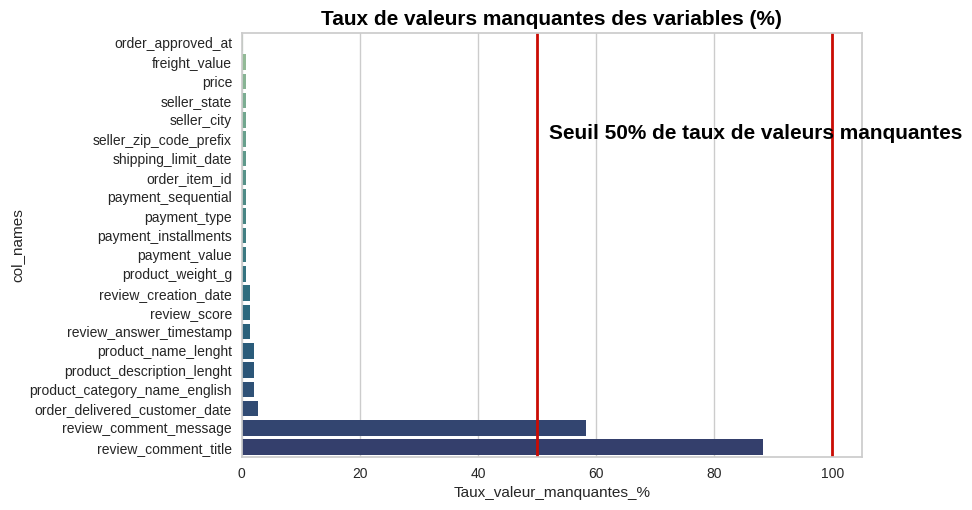

In [21]:
# graphique des taux de valeurs manquantes par colonnes dans le train 
graph_nan(df_nan_train)

* il manque plus de 50% de l'information dans les colonnes concernant les commentaires : review_comment_message et review_comment_title, ce qui est fréquent pour ce genre de données, peu de clients laissent des commentaires sur leur commande. nous allons donc continuer nos traitements avant de les supprimer.
en effet, le petit nombre d'information dans ces colonnes sera certainement utile pour affiner nos futures annalyses

*  pour ce projet, nous avons besoin d'avoir des informations concernant les clients pour lesquels olist a fourni un service complet, nous ne gardons donc que les commandes dont le statut est "delivered"


In [22]:
# pour ce projet, nous avons besoin d'avoir des informations concernant les clients pour lesquels olist a fourni un service complet, nous ne gardons donc que les commandes dont le statut est "delivered"
data_clean.order_status.value_counts()

order_status
delivered      115723
shipped          1256
canceled          734
unavailable       610
invoiced          378
processing        376
created             5
approved            3
Name: count, dtype: int64

In [23]:
# suppression des lignes concernées
data_clean = data_clean[data_clean['order_status'] == 'delivered']
data_clean = data_clean.drop('order_status', axis=1)
recap_nan(data_clean)

Le dataframe sélectionné a 32 colonnes et 115723 lignes.
* Il y a 17 colonnes sans aucune valeur manquante.
* Il y a 15 colonnes avec des valeurs manquantes.
* Parmi ces 15 colonnes, il y a 2 colonnes avec au moins 50% de valeurs manquantes.


,col_names,decompte_NaN,Taux_valeur_manquantes_%
0,payment_sequential,3,0.002592
1,payment_type,3,0.002592
2,payment_installments,3,0.002592
3,payment_value,3,0.002592
4,order_delivered_customer_date,8,0.006913
5,order_approved_at,15,0.012962
6,product_weight_g,20,0.017283
7,review_score,861,0.744018
8,review_creation_date,861,0.744018
9,review_answer_timestamp,861,0.744018


In [24]:
taux_nan(data_clean)

Le dataframe sélectionné contient 4.79 % de valeurs manquantes


* en ne gardant que les commandes délivrées, nous avons effectivement réduits le nombre de données manquantes  sur certaines colonnes.

In [25]:
# nombre d'id unique client généré à la création de chaque compte client
data_clean.customer_unique_id.nunique()

93358

In [26]:
# nombre d'id commande généré à chaque commande
data_clean.order_id.nunique()

96478

In [27]:
# nombre d'id client généré pour chaque commande
data_clean.customer_id.nunique()

96478

## TYPE DES DONNÉES

* les dates

    - mettre les dates au format datetime afin de faciliter les traitements futurs

In [28]:
# mettre au format datetime les colonnes pour le traitement suivant
data_clean['order_purchase_timestamp'] = pd.to_datetime(data_clean.order_purchase_timestamp)
data_clean['order_approved_at'] = pd.to_datetime(data_clean.order_approved_at)
data_clean['order_delivered_customer_date'] = pd.to_datetime(data_clean.order_delivered_customer_date)
data_clean['order_estimated_delivery_date'] = pd.to_datetime(data_clean.order_estimated_delivery_date)
data_clean['review_creation_date'] = pd.to_datetime(data_clean.review_creation_date)
data_clean['review_answer_timestamp'] = pd.to_datetime(data_clean.review_answer_timestamp)


In [29]:
# ajouter les colonnes année, mois et jour de la semaine des commandes pour nos futures analyses
data_clean['annee'] = data_clean.order_purchase_timestamp.dt.year
data_clean['mois'] = data_clean.order_purchase_timestamp.dt.month
# configurer la locale en français 
#locale.setlocale(locale.LC_TIME, 'fr_FR.UTF-8')
#data_clean['jour_semaine'] = data_clean.order_purchase_timestamp.dt.strftime('%A')
# ajout d'une colonne 'jour_semaine' en utilisant le nom du jour en anglais d'abord
data_clean['jour_semaine'] = data_clean.order_purchase_timestamp.dt.day_name()
# traduction
jours_traduction = {
    'Monday': 'Lundi',
    'Tuesday': 'Mardi',
    'Wednesday': 'Mercredi',
    'Thursday': 'Jeudi',
    'Friday': 'Vendredi',
    'Saturday': 'Samedi',
    'Sunday': 'Dimanche'
}
data_clean['jour_semaine'] = data_clean['jour_semaine'].map(jours_traduction)
# définir l'ordre des jours de la semaine en français
jours_ordre = ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche']
jours_ordre_categ = pd.CategoricalDtype(categories=jours_ordre, ordered=True)
data_clean['jour_semaine'] = data_clean['jour_semaine'].astype(jours_ordre_categ)

data_clean.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,payment_installments,payment_value,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,annee,mois,jour_semaine
0,2610,50396,14409,franca,SP,340,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-25 10:35:35,2017-06-05,...,2.0,146.87,4.0,NaN,NaN,2017-05-26,2017-05-30 22:34:40,2017,5,Mardi
1,9561,15433,9790,sao bernardo do campo,SP,15858,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-29 12:41:19,2018-02-06,...,8.0,335.48,5.0,NaN,NaN,2018-01-30,2018-02-10 22:43:29,2018,1,Vendredi
2,30460,2272,1151,sao paulo,SP,68985,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-14 17:58:51,2018-06-13,...,7.0,157.73,5.0,NaN,NaN,2018-06-15,2018-06-15 12:10:59,2018,5,Samedi
3,69605,14192,8775,mogi das cruzes,SP,57577,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-28 16:04:25,2018-04-10,...,1.0,173.30,5.0,NaN,NaN,2018-03-29,2018-04-02 18:36:47,2018,3,Mardi
4,30707,19733,13056,campinas,SP,41738,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-08-09 20:55:48,2018-08-15,...,8.0,252.25,5.0,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10,2018-08-17 01:59:52,2018,7,Dimanche


In [30]:
# ajouter une colonne avec les heures de commandes pour nos futures analyses
data_clean['heure_commande'] = data_clean.order_purchase_timestamp.dt.hour


* les localisations

    - passer les zip_code_prefix en type 'objet', car il ne s'agit pas de variables quantitatives

In [31]:
data_clean['customer_zip_code_prefix'] = data_clean['customer_zip_code_prefix'].astype(object)
data_clean['seller_zip_code_prefix'] = data_clean['seller_zip_code_prefix'].astype(object)
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 115723 entries, 0 to 119084
Data columns (total 36 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    115723 non-null  object        
 1   customer_unique_id             115723 non-null  object        
 2   customer_zip_code_prefix       115723 non-null  object        
 3   customer_city                  115723 non-null  object        
 4   customer_state                 115723 non-null  object        
 5   order_id                       115723 non-null  object        
 6   order_purchase_timestamp       115723 non-null  datetime64[ns]
 7   order_approved_at              115708 non-null  datetime64[ns]
 8   order_delivered_customer_date  115715 non-null  datetime64[ns]
 9   order_estimated_delivery_date  115723 non-null  datetime64[ns]
 10  order_item_id                  115723 non-null  float64       
 11  produ

## FEATURE ENGINEERING

In [32]:
data_wip = data_clean.copy(deep=True)
data_wip.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,payment_value,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,annee,mois,jour_semaine,heure_commande
0,2610,50396,14409,franca,SP,340,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-25 10:35:35,2017-06-05,...,146.87,4.0,NaN,NaN,2017-05-26,2017-05-30 22:34:40,2017,5,Mardi,15
1,9561,15433,9790,sao bernardo do campo,SP,15858,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-29 12:41:19,2018-02-06,...,335.48,5.0,NaN,NaN,2018-01-30,2018-02-10 22:43:29,2018,1,Vendredi,20
2,30460,2272,1151,sao paulo,SP,68985,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-14 17:58:51,2018-06-13,...,157.73,5.0,NaN,NaN,2018-06-15,2018-06-15 12:10:59,2018,5,Samedi,16
3,69605,14192,8775,mogi das cruzes,SP,57577,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-28 16:04:25,2018-04-10,...,173.30,5.0,NaN,NaN,2018-03-29,2018-04-02 18:36:47,2018,3,Mardi,16
4,30707,19733,13056,campinas,SP,41738,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-08-09 20:55:48,2018-08-15,...,252.25,5.0,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10,2018-08-17 01:59:52,2018,7,Dimanche,9


* calculer le nombre total de commande par client

In [33]:
data_wip.loc[data_wip.customer_unique_id == 91344]['order_id']

156       12423
76092      9017
82859     18857
113701     9698
Name: order_id, dtype: object

In [34]:
count = data_wip.copy().filter(['order_id', 'customer_unique_id' ])
count

,order_id,customer_unique_id
0,340,50396
1,15858,15433
2,68985,2272
3,57577,14192
4,41738,19733
...,...,...
119080,40147,9883
119081,61348,80189
119082,99009,87876
119083,88396,43553


In [35]:
customer_order_counts = count.groupby('customer_unique_id')['order_id'].nunique().reset_index()
customer_order_counts.columns = ['customer_unique_id', 'total_nb_commande_client']
customer_order_counts

,customer_unique_id,total_nb_commande_client
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1
...,...,...
93353,96091,1
93354,96092,1
93355,96093,1
93356,96094,1


In [36]:
customer_order_counts.total_nb_commande_client.value_counts()

total_nb_commande_client
1     90557
2      2573
3       181
4        28
5         9
6         5
7         3
9         1
15        1
Name: count, dtype: int64

In [37]:
data_wip = pd.merge(data_wip, customer_order_counts, on='customer_unique_id', how='left')
data_wip[data_wip.total_nb_commande_client >1].head(10)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,annee,mois,jour_semaine,heure_commande,total_nb_commande_client
5,52561,28805,89254,jaragua do sul,SC,33883,2017-09-14 18:14:31,2017-09-14 18:25:11,2017-09-28 17:32:43,2017-10-04,...,5.0,NaN,Loja responsável,2017-09-29,2017-10-01 21:52:53,2017,9,Jeudi,18,2
8,35166,6611,81560,curitiba,PR,11929,2018-01-18 12:35:44,2018-01-18 12:56:32,2018-01-26 15:17:57,2018-02-20,...,5.0,NaN,chegou antes do prometido,2018-01-27,2018-01-30 19:18:27,2018,1,Jeudi,12,2
13,91388,15532,5704,sao paulo,SP,51579,2018-03-07 15:57:14,2018-03-07 16:15:30,2018-03-15 00:46:30,2018-03-19,...,3.0,NaN,Produto chegou no prazo o problema que veio na...,2018-03-16,2018-03-16 11:12:20,2018,3,Mercredi,15,2
35,17580,87843,42800,camacari,BA,9992,2018-04-18 09:42:53,2018-04-18 09:55:17,2018-05-17 20:19:49,2018-05-18,...,5.0,Muito boa qualidade,NaN,2018-05-18,2018-05-20 07:46:57,2018,4,Mercredi,9,2
36,69618,84358,27525,resende,RJ,46439,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,2017-07-07,...,5.0,NaN,NaN,2017-07-08,2017-07-09 03:16:23,2017,6,Mercredi,18,2
37,69618,84358,27525,resende,RJ,46439,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,2017-07-07,...,5.0,NaN,NaN,2017-07-08,2017-07-09 03:16:23,2017,6,Mercredi,18,2
47,63577,75584,5727,sao paulo,SP,17667,2018-01-31 16:43:23,2018-02-01 11:35:44,2018-02-10 16:12:22,2018-02-22,...,5.0,NaN,Muito boas. Obrigado.,2018-02-11,2018-02-11 20:12:37,2018,1,Mercredi,16,2
102,24612,45946,9890,sao bernardo do campo,SP,13837,2018-05-16 23:45:47,2018-05-18 04:36:16,2018-05-21 13:48:28,2018-06-13,...,5.0,NaN,NaN,2018-05-22,2018-05-24 23:13:57,2018,5,Mercredi,23,2
103,24612,45946,9890,sao bernardo do campo,SP,13837,2018-05-16 23:45:47,2018-05-18 04:36:16,2018-05-21 13:48:28,2018-06-13,...,5.0,NaN,NaN,2018-05-22,2018-05-24 23:13:57,2018,5,Mercredi,23,2
131,98818,36543,36780,astolfo dutra,MG,90795,2018-04-17 09:48:44,2018-04-17 10:55:32,2018-04-25 22:16:46,2018-05-08,...,5.0,NaN,NaN,2018-04-26,2018-05-01 04:28:51,2018,4,Mardi,9,2


In [38]:
#vérification
data_wip.loc[data_wip.customer_unique_id == 91344]['total_nb_commande_client']

149       4
73949     4
80532     4
110472    4
Name: total_nb_commande_client, dtype: int64

* calculer le nombre total de produit par commande

In [39]:
# Calculer le nombre de produits  par commande unique
count_prod = data_wip.copy().filter(['order_id', 'order_item_id' ])
order_prod_counts = count_prod.groupby('order_id')['order_item_id'].nunique().reset_index()
order_prod_counts.columns = ['order_id', 'total_nb_produit_commande']
order_prod_counts['total_nb_produit_commande'].value_counts()
#order_prod_counts

total_nb_produit_commande
1     86843
2      7392
3      1306
4       495
5       193
6       191
7        22
8         8
10        8
12        5
11        4
9         3
15        2
14        2
20        2
13        1
21        1
Name: count, dtype: int64

In [40]:
data_wip = pd.merge(data_wip, order_prod_counts, on='order_id', how='left')
data_wip[data_wip.total_nb_produit_commande >1].head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,annee,mois,jour_semaine,heure_commande,total_nb_commande_client,total_nb_produit_commande
22,40597,63675,74914,aparecida de goiania,GO,66209,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,2017-11-06,...,NaN,Bom dia eu fiz uma compra de 03 peças só mim e...,2017-10-26,2017-10-27 09:19:26,2017,10,Dimanche,11,1,3
23,40597,63675,74914,aparecida de goiania,GO,66209,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,2017-11-06,...,NaN,Bom dia eu fiz uma compra de 03 peças só mim e...,2017-10-26,2017-10-27 09:19:26,2017,10,Dimanche,11,1,3
24,40597,63675,74914,aparecida de goiania,GO,66209,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,2017-11-06,...,NaN,Bom dia eu fiz uma compra de 03 peças só mim e...,2017-10-26,2017-10-27 09:19:26,2017,10,Dimanche,11,1,3
36,69618,84358,27525,resende,RJ,46439,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,2017-07-07,...,NaN,NaN,2017-07-08,2017-07-09 03:16:23,2017,6,Mercredi,18,2,2
37,69618,84358,27525,resende,RJ,46439,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,2017-07-07,...,NaN,NaN,2017-07-08,2017-07-09 03:16:23,2017,6,Mercredi,18,2,2


In [41]:
data_wip.loc[data_wip.order_id == 50543]['total_nb_produit_commande']

54822    21
54823    21
54824    21
54825    21
54826    21
54827    21
54828    21
54829    21
54830    21
54831    21
54832    21
54833    21
54834    21
54835    21
54836    21
54837    21
54838    21
54839    21
54840    21
54841    21
54842    21
Name: total_nb_produit_commande, dtype: int64

* calculer le montant total d'un produit : prix unitaire + frais de livraison unitaire

In [42]:
# montant total prix produit + livraison par ligne produit
data_wip['total_prix_fret_produit'] = data_wip.price + data_wip.freight_value

* calculer le montant total d'une commande (cumul de tous les prix articles et de tous les frais de livraison)

In [43]:
# montant total de chaque commande (prix article + frais de livraison pour tous les articles de la commande)
totals_groupby = data_wip.groupby('order_id')['total_prix_fret_produit'].sum().reset_index()
totals_groupby.columns = ['order_id', 'total_commande']
data_wip = pd.merge(data_wip, totals_groupby, on='order_id', how='left')

data_wip[data_wip['total_nb_produit_commande']>1].head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,review_creation_date,review_answer_timestamp,annee,mois,jour_semaine,heure_commande,total_nb_commande_client,total_nb_produit_commande,total_prix_fret_produit,total_commande
22,40597,63675,74914,aparecida de goiania,GO,66209,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,2017-11-06,...,2017-10-26,2017-10-27 09:19:26,2017,10,Dimanche,11,1,3,77.57,232.71
23,40597,63675,74914,aparecida de goiania,GO,66209,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,2017-11-06,...,2017-10-26,2017-10-27 09:19:26,2017,10,Dimanche,11,1,3,77.57,232.71
24,40597,63675,74914,aparecida de goiania,GO,66209,2017-10-15 11:08:48,2017-10-15 11:25:49,2017-10-25 22:30:58,2017-11-06,...,2017-10-26,2017-10-27 09:19:26,2017,10,Dimanche,11,1,3,77.57,232.71
36,69618,84358,27525,resende,RJ,46439,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,2017-07-07,...,2017-07-08,2017-07-09 03:16:23,2017,6,Mercredi,18,2,2,73.12,134.25
37,69618,84358,27525,resende,RJ,46439,2017-06-14 18:31:54,2017-06-15 18:43:04,2017-07-07 20:32:47,2017-07-07,...,2017-07-08,2017-07-09 03:16:23,2017,6,Mercredi,18,2,2,61.13,134.25


* calculer les écarts entre les différentes dates disponibles

In [44]:
# durée en minutes entre la validation de la commande par le vendeur et la validation de la commande par le client
data_wip['delai_confirmation_commande_min'] = ((data_wip.order_approved_at -data_wip.order_purchase_timestamp).dt.seconds / 60).round().fillna(0).astype(int)
# durée en jour de l'écart entre la date de livraison estimée donnée au client et la date réelle de livraison
data_wip['écart_estimation_livraison_jour'] = (data_wip.order_delivered_customer_date - data_wip.order_estimated_delivery_date ).dt.days.fillna(0).astype(int)
# durée en jour entre la validation de la commande par le client et la date effective de livraison
data_wip['délai_commande_livraison_jour'] = (data_wip.order_delivered_customer_date - data_wip.order_purchase_timestamp).dt.days.fillna(0).astype(int)
# écart en heure date de réception de la commande et date de la création de la review 
data_wip['delai_reception_review_heure'] = ((data_wip.review_creation_date -data_wip.order_delivered_customer_date).dt.seconds / 3600).round().fillna(0).astype(int)
# écart en jour date de la création de la review et de la réponse du vendeur
data_wip['délai_review_reponse_vendeur_jour'] = (data_wip.review_answer_timestamp - data_wip.review_creation_date ).dt.days.fillna(0).astype(int)
data_wip.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,heure_commande,total_nb_commande_client,total_nb_produit_commande,total_prix_fret_produit,total_commande,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,delai_reception_review_heure,délai_review_reponse_vendeur_jour
0,2610,50396,14409,franca,SP,340,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-25 10:35:35,2017-06-05,...,15,1,1,146.87,146.87,17,-11,8,13,4
1,9561,15433,9790,sao bernardo do campo,SP,15858,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-29 12:41:19,2018-02-06,...,20,1,1,335.48,335.48,10,-8,16,11,11
2,30460,2272,1151,sao paulo,SP,68985,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-14 17:58:51,2018-06-13,...,16,1,1,157.73,157.73,11,1,26,6,0
3,69605,14192,8775,mogi das cruzes,SP,57577,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-28 16:04:25,2018-04-10,...,16,1,1,173.30,173.30,83,-13,14,8,4
4,30707,19733,13056,campinas,SP,41738,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-08-09 20:55:48,2018-08-15,...,9,1,1,252.25,252.25,19,-6,11,3,7


* calculer les longueurs de titre et de commentaires des reviews

In [45]:
# longueur des commeantaires des reviews
data_wip['lenght_comment'] = data_wip['review_comment_message'].str.len().fillna(0).astype(int)
# longueur des titres des reviews
data_wip['lenght_title'] = data_wip['review_comment_title'].str.len().fillna(0).astype(int)
data_wip.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,total_nb_produit_commande,total_prix_fret_produit,total_commande,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title
0,2610,50396,14409,franca,SP,340,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-25 10:35:35,2017-06-05,...,1,146.87,146.87,17,-11,8,13,4,0,0
1,9561,15433,9790,sao bernardo do campo,SP,15858,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-29 12:41:19,2018-02-06,...,1,335.48,335.48,10,-8,16,11,11,0,0
2,30460,2272,1151,sao paulo,SP,68985,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-14 17:58:51,2018-06-13,...,1,157.73,157.73,11,1,26,6,0,0,0
3,69605,14192,8775,mogi das cruzes,SP,57577,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-28 16:04:25,2018-04-10,...,1,173.30,173.30,83,-13,14,8,4,0,0
4,30707,19733,13056,campinas,SP,41738,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-08-09 20:55:48,2018-08-15,...,1,252.25,252.25,19,-6,11,3,7,45,13


# ANALYSE EXPLORATOIRE

In [46]:
data_analyse = data_wip.copy(deep= True)

In [47]:
clients = data_analyse.filter(['customer_unique_id', 'total_nb_produit_commande', 'total_nb_commande_client'])
clients_groupby = clients.groupby('customer_unique_id')[['total_nb_produit_commande', 'total_nb_commande_client']].max().reset_index()

clients_groupby.describe(include=np.number)

,customer_unique_id,total_nb_produit_commande,total_nb_commande_client
count,93358.000000,93358.000000,93358.000000
mean,48054.417211,1.144551,1.033420
std,27735.291630,0.542941,0.209097
min,0.000000,1.000000,1.000000
25%,24046.250000,1.000000,1.000000
50%,48071.500000,1.000000,1.000000
75%,72067.750000,1.000000,1.000000
max,96095.000000,21.000000,15.000000


## analyse du total de commande par client

In [48]:
x =clients_groupby['total_nb_commande_client'].value_counts().sort_index().index
x

Index([1, 2, 3, 4, 5, 6, 7, 9, 15], dtype='int64', name='total_nb_commande_client')

In [49]:
y = clients_groupby['total_nb_commande_client'].value_counts().sort_index().values
y

array([90557,  2573,   181,    28,     9,     5,     3,     1,     1])

In [50]:
nb_tot_commande = data_analyse.order_id.nunique()
nb_tot_commande

96478

In [51]:
percent = (y/nb_tot_commande*100)
percent

array([9.38628496e+01, 2.66692925e+00, 1.87607537e-01, 2.90221605e-02,
       9.32855159e-03, 5.18252866e-03, 3.10951720e-03, 1.03650573e-03,
       1.03650573e-03])

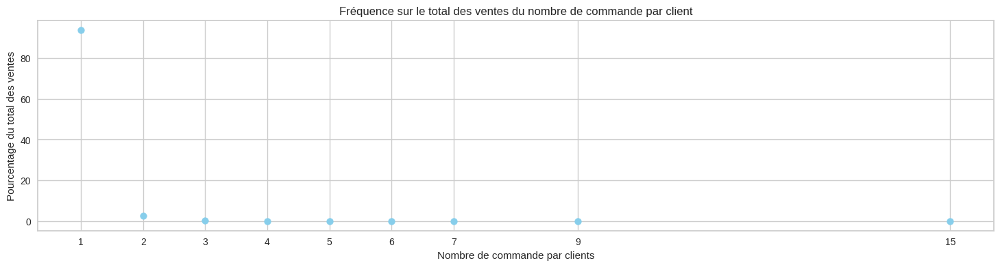

In [52]:
# Obtenir les valeurs uniques de total_nb_commande_client et leurs fréquences
#values, counts = pd.Series(clients['total_nb_commande_client']).value_counts().sort_index().values, pd.Series(clients['total_nb_commande_client']).value_counts().sort_index().index
# Créer un graphique avec un nuage de points
plt.figure(figsize=(18, 4))
plt.scatter(x, percent, color='skyblue', marker='o')
plt.title('Fréquence sur le total des ventes du nombre de commande par client')
plt.xlabel('Nombre de commande par clients')
plt.ylabel('Pourcentage du total des ventes')
plt.xticks(x, x)
plt.grid(True)

plt.show()

#pourcentage en nombre de client total

* près de 94% des clients n'ont effectué qu'une seule commande

## analyse du total de produits par commande

In [53]:
x =clients_groupby['total_nb_produit_commande'].value_counts().sort_index().index
x

Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 20, 21], dtype='int64', name='total_nb_produit_commande')

In [54]:
y = clients_groupby['total_nb_produit_commande'].value_counts().sort_index().values
y

array([83872,  7282,  1287,   486,   187,   186,    22,     8,     3,
           8,     4,     5,     1,     2,     2,     2,     1])

In [55]:
nb_tot_commande = data_analyse.order_id.nunique()
nb_tot_commande

96478

In [56]:
y_percent = (y/nb_tot_commande*100)
y_percent

array([8.69338087e+01, 7.54783474e+00, 1.33398288e+00, 5.03741786e-01,
       1.93826572e-01, 1.92790066e-01, 2.28031261e-02, 8.29204586e-03,
       3.10951720e-03, 8.29204586e-03, 4.14602293e-03, 5.18252866e-03,
       1.03650573e-03, 2.07301146e-03, 2.07301146e-03, 2.07301146e-03,
       1.03650573e-03])

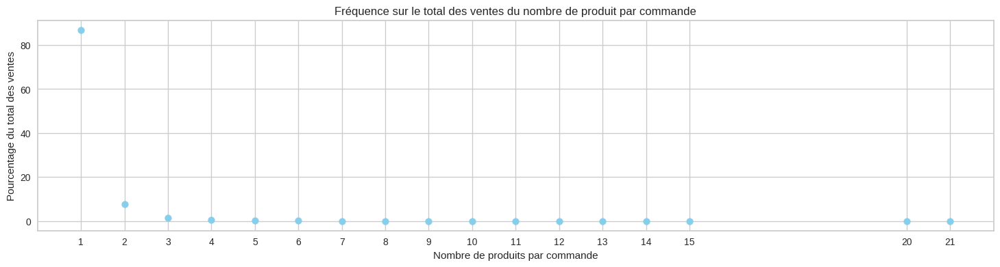

In [57]:
plt.figure(figsize=(18, 4))
plt.scatter(x, y_percent, color='skyblue', marker='o')
plt.title('Fréquence sur le total des ventes du nombre de produit par commande')
plt.xlabel('Nombre de produits par commande')
plt.ylabel('Pourcentage du total des ventes')
plt.xticks(x, x)
plt.grid(True)
plt.show()


* près de 87% des commandes ne comportent qu'un seul article

* de manière générale, il y a peu de renouvellement et de fidélisation de la part des clients ce qui indique:
    - le comportement d'achat unique (One-time purchase behavior) de cette clientèle de passage est manifestement la base de clientèle de olist (est-ce dû à un mécontentement, ou simplement au type de produit vendus ?)
    - le taux d'attrition (churn) doit être de toute évidence élevé, il y a un manque de rétention client manifeste.

## analyse des features commandes rajoutées


In [58]:
data_analyse.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'order_id',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_item_id', 'product_id', 'product_category_name_english',
       'product_description_lenght', 'product_name_lenght', 'product_weight_g',
       'seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp', 'annee', 'mois',
       'jour_semaine', 'heure_commande', 'total_nb_commande_client',
       'total_nb_produit_commande', 'total_prix_fret_produit',
       'total_commande', 'delai_confirmation_commande_min',
       'écart_estimation_livraison_

In [59]:
data_analyse.loc[0]

customer_id                                         2610
customer_unique_id                                 50396
customer_zip_code_prefix                           14409
customer_city                                     franca
customer_state                                        SP
order_id                                             340
order_purchase_timestamp             2017-05-16 15:05:35
order_approved_at                    2017-05-16 15:22:12
order_delivered_customer_date        2017-05-25 10:35:35
order_estimated_delivery_date        2017-06-05 00:00:00
order_item_id                                        1.0
product_id                                         21694
product_category_name_english           office_furniture
product_description_lenght                        1141.0
product_name_lenght                                 41.0
product_weight_g                                  8683.0
seller_id                                           1535
seller_zip_code_prefix         

In [60]:
commandes = data_analyse.filter(['delai_confirmation_commande_min', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour', 'total_prix_fret_produit', 'total_commande' ])
commandes.describe(include=np.number)

,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,total_prix_fret_produit,total_commande
count,115723.000000,115723.000000,115723.000000,115723.000000,115723.000000
mean,238.682855,-12.046456,12.021396,139.892495,213.856811
std,397.406368,10.162077,9.454837,189.722499,424.483557
min,0.000000,-147.000000,0.000000,6.080000,10.070000
25%,13.000000,-17.000000,6.000000,55.220000,68.350000
50%,20.000000,-13.000000,10.000000,91.790000,120.980000
75%,288.000000,-7.000000,15.000000,157.220000,212.980000
max,1440.000000,188.000000,209.000000,6929.310000,13664.080000


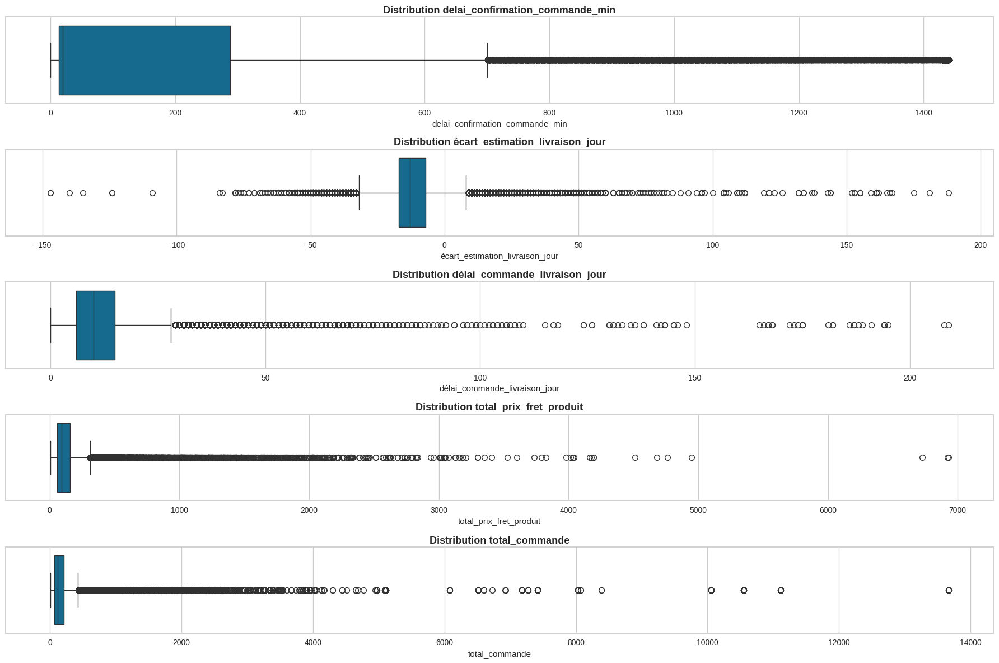

In [61]:
fig, axes = plt.subplots(5, 1, figsize=(18, 12))
colonnes = commandes.columns

for i, col in enumerate(colonnes):
    sns.boxplot(x=col, data=commandes, ax=axes[i])
    axes[i].set_title(f'Distribution {col}', fontsize = 13, weight= 'bold')
    axes[i].set_xlabel(col)

# Ajuster les espacements
plt.tight_layout()
plt.show()


* la médiane du délai de confirmation d'une commande par un client est très rapide, elle se fait en générale en 20 minutes
* la médiane de l'écart entre la date estimée de livraison et la date effective de livraison chez le client est en dessous de zéro (-13 jours), ce qui indique que la plupart des commandes sont livrées en avance par rapport au prévision. cela semble plutôt positif, malgré evidemment la présence d'outlier dans la tranche supérieure : certaines livraisons observent des retards dépassant les 10 jours et peuvent atteindre 188 jours de retards, cette source d'insatisfaction semble néanmoins assez exceptionnelle.
* on observe ainsi un phénomène similaire dans le délai entre la commande et la livraison, la plupart des commandes étant livrées en 10 jours, et l'ont retrouve les cas rares de délai de livraison pouvant dépasser les 200jours d'attente.
* la plupart des produits vendus (prix article unitaire + frais de livraison unitaire) sont relativement peu élevés (91.8 Reals), le montant par article moyen est à 139.9 Reals. au délà de 200 Réals environ, nous arrivons dans des montants articles hors normes et rares pouvant atteindre les 6929 Réals.
* concernant le total par commande, le panier moyen est de 213.8 Réals, le panier médian étant de 120.98 Réals. ce qui s'explique comme précédemment par la présence de certains articles et commandes hors normes dont le total peut atteindre les 13664 Réals.

* de manière générale, les délai de livraison et le respect de ceux ci, semblent indiquer que les clients ont dans leur grande majorité reçu leur article dans les délais prévus voire en avance.
* concernant les montants des commandes, les clients chez olist ont plutôt tendance à avoir des paniers de valeur faible à moyenne.


## analyse des clients

### ville de résidence

In [62]:
geoloc_clients = data_analyse.filter(['customer_unique_id', 'customer_zip_code_prefix', 'customer_city', 'customer_state'])
geoloc_clients = geoloc_clients.groupby('customer_unique_id')[['customer_zip_code_prefix', 'customer_city', 'customer_state']].first().reset_index()
geoloc_clients.describe(include='object')

,customer_zip_code_prefix,customer_city,customer_state
count,93358,93358,93358
unique,14878,4084,27
top,22790,sao paulo,SP
freq,132,14516,39149


In [63]:
customer_city = geoloc_clients.customer_city.value_counts(normalize = True)[:10] * 100
customer_city

customer_city
sao paulo                15.548748
rio de janeiro            6.804987
belo horizonte            2.790334
brasilia                  2.153002
curitiba                  1.534951
campinas                  1.458900
porto alegre              1.383920
salvador                  1.235031
guarulhos                 1.187900
sao bernardo do campo     0.943679
Name: proportion, dtype: float64

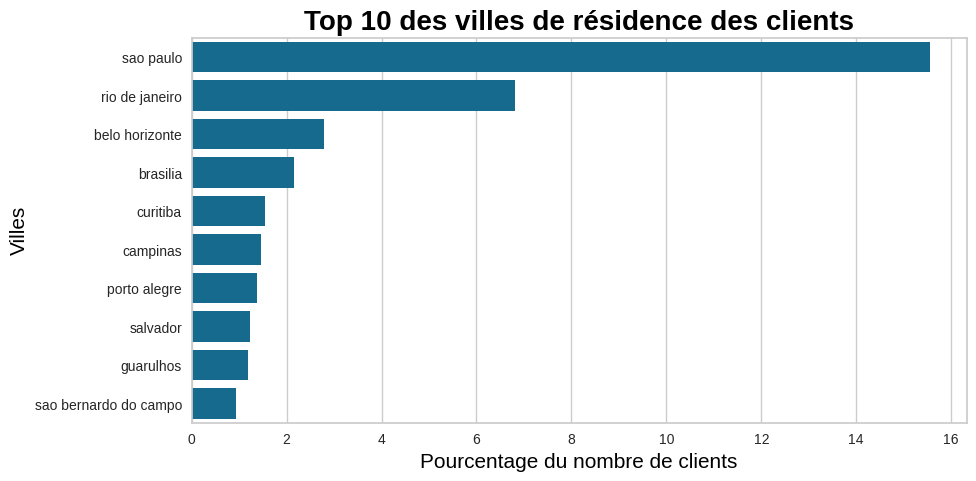

In [64]:
plt.figure(figsize=(10, 5))
sns.barplot(y = customer_city.index, x = customer_city.values)
plt.xlabel('Pourcentage du nombre de clients',color='black',fontsize=15)
plt.ylabel('Villes',color='black',fontsize=15)
plt.title('Top 10 des villes de résidence des clients',color='black',fontsize=20,fontweight='bold')
plt.show()

* Sao Paulo est la ville où habitent le plus de clients, près de 16%
* Rio de Janeiro est la deuxième ville du podium avec près de 7% des clients qui y résident 

### état de résidence

In [65]:
customer_state = geoloc_clients.customer_state.value_counts(normalize = True)[:10] * 100
customer_state

customer_state
SP    41.934275
RJ    12.758414
MG    11.779387
RS     5.535680
PR     5.108293
SC     3.689025
BA     3.381606
DF     2.160500
ES     2.064097
GO     2.028750
Name: proportion, dtype: float64

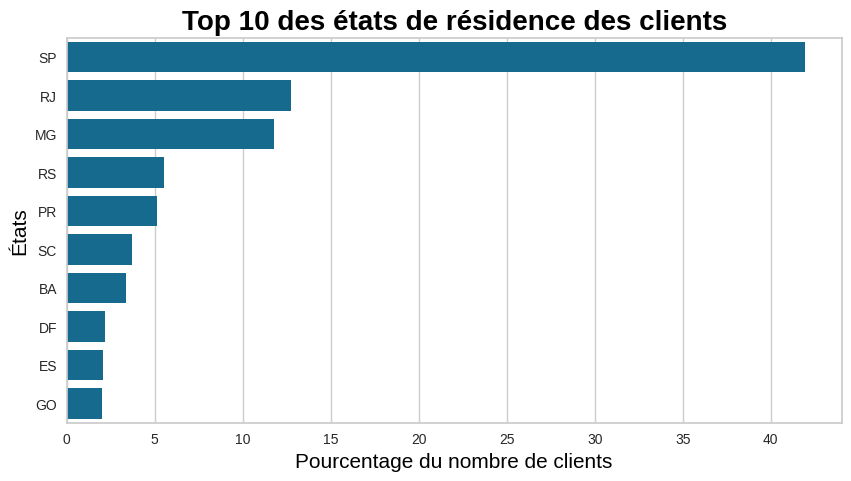

In [66]:
plt.figure(figsize=(10, 5))
sns.barplot(y = customer_state.index, x = customer_state.values)
plt.xlabel('Pourcentage du nombre de clients',color='black',fontsize=15)
plt.ylabel('États',color='black',fontsize=15)
plt.title('Top 10 des états de résidence des clients',color='black',fontsize=20,fontweight='bold')
plt.show()

* L'état de Sao Paulo est l'état où habitent la majorité des clients, à lui seul c'est l'état où résident près de 42% des clients
* L'état de Rio de Janeiro, le deuxième de ce top, représente un peu moins de 13% des clients;
* pour les états qui représentent moins de 5% de la clientèle, on pourrait les regrouper dans une catégorie "autre_état"

* la grande majorité des clients d'Olist est donc urbaine, issue des plus grandes ville du pays

## analyses des vendeurs


### les plus gros vendeurs en volume

In [67]:
vendeurs = data_analyse.filter(['order_id', 'seller_id'])
vendeurs = vendeurs.groupby('seller_id')['order_id'].nunique().reset_index()
vendeurs.columns = ['seller_id', 'tot_commande_vendeurs'] 
vendeurs = vendeurs.sort_values(by='tot_commande_vendeurs', ascending= False)
vendeurs

,seller_id,tot_commande_vendeurs
1190,1235,1819
858,881,1772
2388,2481,1651
358,368,1399
2543,2643,1311
...,...,...
1957,2034,1
2522,2621,1
436,449,1
1954,2031,1


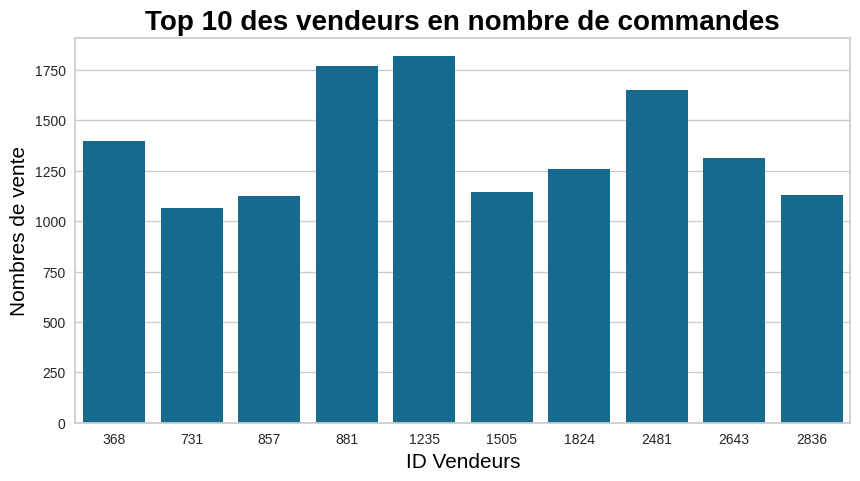

In [68]:
plt.figure(figsize=(10, 5))
sns.barplot(x = vendeurs.seller_id[:10], y = vendeurs.tot_commande_vendeurs[:10])
plt.ylabel('Nombres de vente',color='black',fontsize=15)
plt.xlabel('ID Vendeurs',color='black',fontsize=15)
plt.title('Top 10 des vendeurs en nombre de commandes',color='black',fontsize=20,fontweight='bold')
plt.show()

### les plus gros vendeurs en CA

In [69]:
vendeurs_ca = data_analyse.filter(['seller_id', 'total_commande'])
vendeurs_ca = vendeurs_ca.groupby('seller_id')['total_commande'].sum().reset_index()
vendeurs_ca.columns = ['seller_id', 'tot_ca_vendeurs'] 
vendeurs_ca = vendeurs_ca.sort_values(by='tot_ca_vendeurs', ascending= False)
vendeurs_ca

,seller_id,tot_ca_vendeurs
1480,1535,723736.38
858,881,424413.52
982,1013,389660.92
2543,2643,361247.93
188,192,341399.30
...,...,...
2250,2338,19.89
2007,2087,19.21
1319,1370,18.56
846,869,16.36


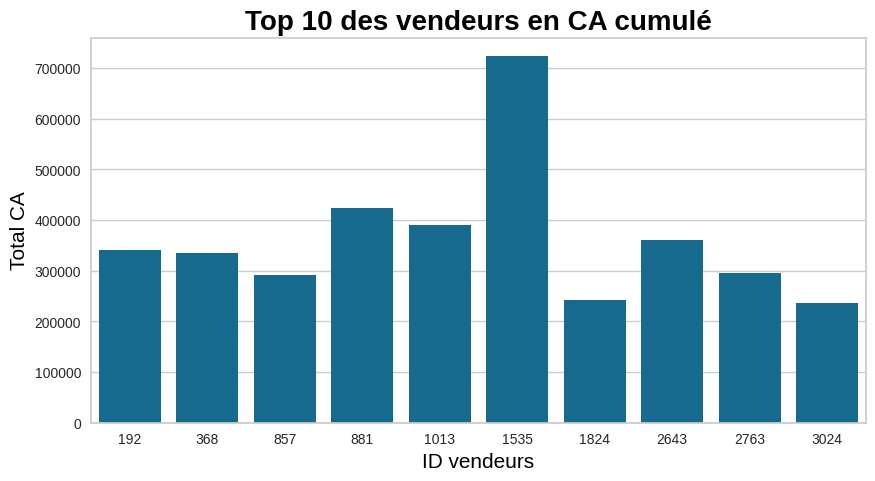

In [70]:
plt.figure(figsize=(10, 5))
sns.barplot(x = vendeurs_ca.seller_id[:10], y = vendeurs_ca.tot_ca_vendeurs[:10])
plt.ylabel('Total CA',color='black',fontsize=15)
plt.xlabel('ID vendeurs',color='black',fontsize=15)
plt.title('Top 10 des vendeurs en CA cumulé',color='black',fontsize=20,fontweight='bold')
plt.show()

* sur les 2 top 10, en volume et en CA, on ne retrouvent que 4 vendeurs dans les 2 top : 881 / 368 / 2643 / 1824
* ces 4 vendeurs sont les plus intéressant en terme de volume et de CA

### ville des vendeurs

In [71]:
geoloc_vendeurs = data_analyse.filter(['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state'])
geoloc_vendeurs = geoloc_vendeurs.groupby('seller_id')[['seller_zip_code_prefix', 'seller_city', 'seller_state']].first().reset_index()
geoloc_vendeurs.describe(include='object')

,seller_zip_code_prefix,seller_city,seller_state
count,2970.0,2970,2970
unique,2168.0,595,22
top,14940.0,sao paulo,SP
freq,49.0,661,1769


In [72]:
ville_vendeurs = geoloc_vendeurs.seller_city.value_counts(normalize = True)[:10] * 100
ville_vendeurs

seller_city
sao paulo         22.255892
curitiba           4.175084
rio de janeiro     3.097643
belo horizonte     2.188552
ribeirao preto     1.683502
ibitinga           1.649832
guarulhos          1.616162
santo andre        1.481481
maringa            1.346801
campinas           1.346801
Name: proportion, dtype: float64

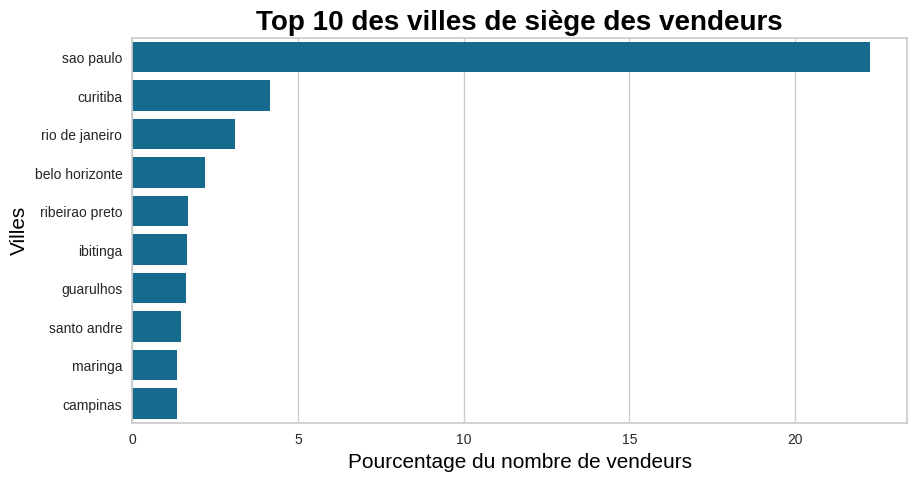

In [73]:
plt.figure(figsize=(10, 5))
sns.barplot(y = ville_vendeurs.index, x = ville_vendeurs.values)
plt.xlabel('Pourcentage du nombre de vendeurs',color='black',fontsize=15)
plt.ylabel('Villes',color='black',fontsize=15)
plt.title('Top 10 des villes de siège des vendeurs',color='black',fontsize=20,fontweight='bold')
plt.show()

* Sao Paulo est la ville où sont établis la majorité des entreprises, un peu plus de 22% 
* Curitiba est la deuxième ville du podium avec seulement 4% des entreprises qui y sont domiciliées

### état des vendeurs

In [74]:
etat_vendeurs = geoloc_vendeurs.seller_state.value_counts(normalize = True)[:10] * 100
etat_vendeurs

seller_state
SP    59.562290
PR    11.279461
MG     7.946128
SC     6.195286
RJ     5.488215
RS     4.208754
GO     1.313131
DF     1.010101
ES     0.740741
BA     0.606061
Name: proportion, dtype: float64

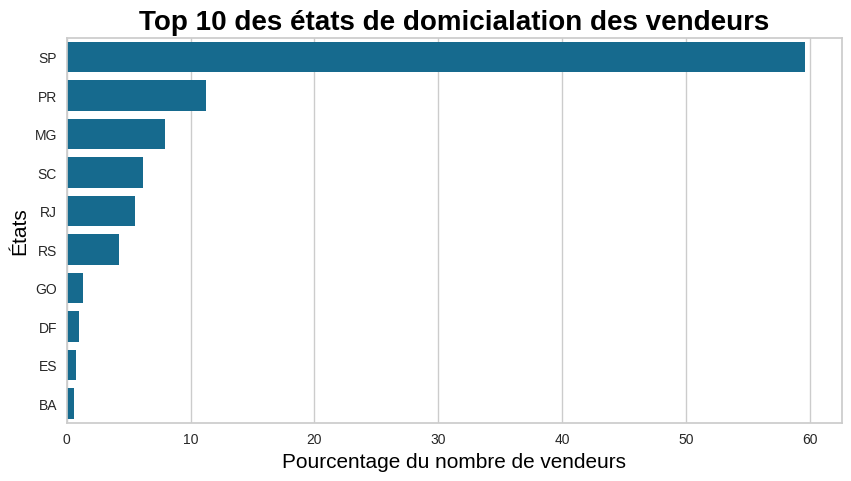

In [75]:
plt.figure(figsize=(10, 5))
sns.barplot(y = etat_vendeurs.index, x = etat_vendeurs.values)
plt.xlabel('Pourcentage du nombre de vendeurs',color='black',fontsize=15)
plt.ylabel('États',color='black',fontsize=15)
plt.title('Top 10 des états de domicialation des vendeurs',color='black',fontsize=20,fontweight='bold')
plt.show()

* L'état de Sao Paulo est l'état où est établie la très grande majorité des vendeurs, à lui seul c'est l'état où résident près de 60% des vendeurs
* L'état de Parana, le deuxième de ce top, représente un peu moins de 12% des vendeurs, sa capitale est Curibita (cela correspond avec le top des villes des vendeurs)


* la grande majorité des vendeurs d'Olist se trouve en zone urbaine, proche de la majorité des clients

## analyses des produits


### les prix des produits

In [76]:
data_analyse.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115723 entries, 0 to 115722
Data columns (total 47 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   customer_id                        115723 non-null  object        
 1   customer_unique_id                 115723 non-null  object        
 2   customer_zip_code_prefix           115723 non-null  object        
 3   customer_city                      115723 non-null  object        
 4   customer_state                     115723 non-null  object        
 5   order_id                           115723 non-null  object        
 6   order_purchase_timestamp           115723 non-null  datetime64[ns]
 7   order_approved_at                  115708 non-null  datetime64[ns]
 8   order_delivered_customer_date      115715 non-null  datetime64[ns]
 9   order_estimated_delivery_date      115723 non-null  datetime64[ns]
 10  order_item_id       

In [77]:
prix_produits = data_analyse.filter(['product_id', 'product_category_name_english', 'price', 'freight_value', 'total_prix_fret_produit'])
prix_produits = prix_produits.groupby(['product_id', 'product_category_name_english'])[[ 'price', 'freight_value', 'total_prix_fret_produit']].first().reset_index()
prix_produits = prix_produits.sort_values(by='price', ascending= False)
prix_produits['product_id'] = prix_produits['product_id'].astype('object')
prix_produits

,product_id,product_category_name_english,price,freight_value,total_prix_fret_produit
9055,9434,housewares,6735.00,194.31,6929.31
13137,13693,computers,6729.00,193.21,6922.21
3548,3698,art,6499.00,227.66,6726.66
20467,21316,small_appliances,4799.00,151.34,4950.34
24185,25197,small_appliances,4690.00,74.34,4764.34
...,...,...,...,...,...
6133,6388,stationery,2.29,7.78,10.07
8868,9238,health_beauty,2.20,7.39,9.59
670,700,health_beauty,1.20,7.89,9.09
4953,5158,health_beauty,1.20,7.89,9.09


In [78]:
prix_produits.describe()

,price,freight_value,total_prix_fret_produit
count,31621.000000,31621.000000,31621.000000
mean,144.915400,21.187529,166.102928
std,246.248085,18.712483,255.049893
min,0.850000,0.000000,6.080000
25%,39.900000,13.370000,55.460000
50%,79.000000,16.590000,97.020000
75%,154.900000,22.010000,178.430000
max,6735.000000,409.680000,6929.310000


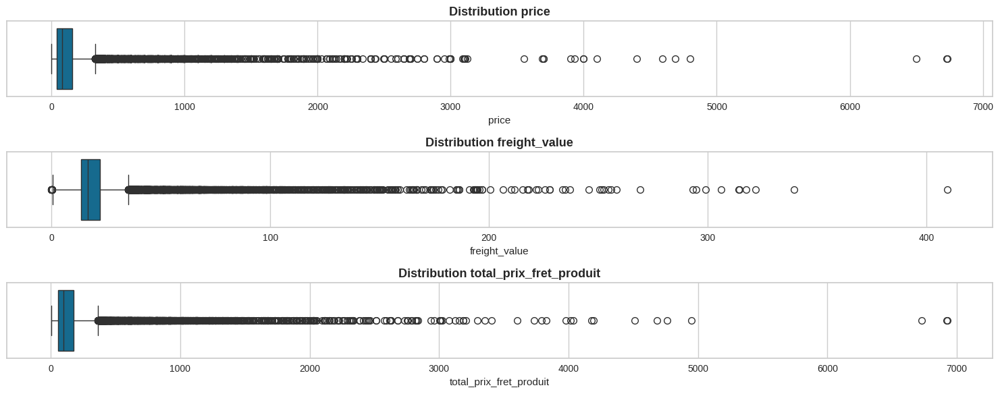

In [79]:
fig, axes = plt.subplots(3, 1, figsize=(15, 6))
colonnes = prix_produits.select_dtypes(exclude=[object]).columns

for i, col in enumerate(colonnes):
    sns.boxplot(x=col, data=prix_produits.select_dtypes(exclude=[object]), ax=axes[i])
    axes[i].set_title(f'Distribution {col}', fontsize = 13, weight= 'bold')
    axes[i].set_xlabel(col)

# Ajuster les espacements
plt.tight_layout()
plt.show()

### les catégories de produits les plus vendus

In [80]:
top_produits = data_analyse.filter(['product_category_name_english', 'total_nb_produit_commande', 'price', 'freight_value', 'total_prix_fret_produit'])
top_produits = top_produits.groupby(['product_category_name_english'])[['total_nb_produit_commande', 'price', 'freight_value', 'total_prix_fret_produit']].sum().reset_index()
top_produits = top_produits.sort_values(by='total_nb_produit_commande', ascending= False)
top_produits

,product_category_name_english,total_nb_produit_commande,price,freight_value,total_prix_fret_produit
7,bed_bath_table,17407,1092461.20,217268.65,1309729.85
39,furniture_decor,15254,753082.79,178671.35,931754.14
43,health_beauty,12672,1275776.49,185573.26,1461349.75
15,computers_accessories,12126,926557.43,150926.20,1077483.63
49,housewares,11424,650395.78,151125.67,801521.45
...,...,...,...,...,...
3,arts_and_craftmanship,28,1814.01,370.13,2184.14
52,la_cuisine,20,2303.98,386.89,2690.87
11,cds_dvds_musicals,18,730.00,224.99,954.99
29,fashion_childrens_clothes,9,519.95,78.72,598.67


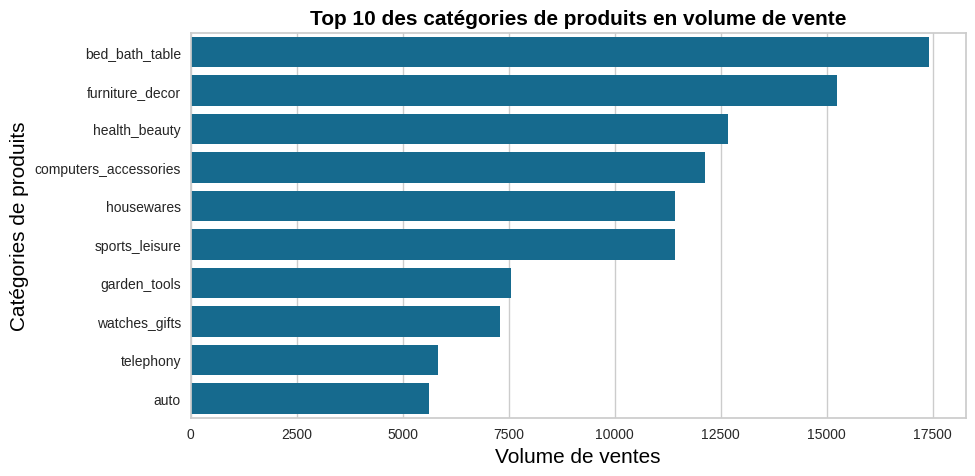

In [81]:
plt.figure(figsize=(10, 5))
sns.barplot(y = top_produits.product_category_name_english.values[:10], x = top_produits.total_nb_produit_commande.values[:10])
plt.xlabel('Volume de ventes',color='black',fontsize=15)
plt.ylabel('Catégories de produits',color='black',fontsize=15)
plt.title('Top 10 des catégories de produits en volume de vente',color='black',fontsize=15,fontweight='bold')
plt.show()

### les catégories de produits générant le plus grand chiffre d'affaire

In [82]:
top_produits = top_produits.sort_values(by='price', ascending= False)
top_produits

,product_category_name_english,total_nb_produit_commande,price,freight_value,total_prix_fret_produit
43,health_beauty,12672,1275776.49,185573.26,1461349.75
70,watches_gifts,7289,1214620.45,102076.39,1316696.84
7,bed_bath_table,17407,1092461.20,217268.65,1309729.85
65,sports_leisure,11421,995980.76,170326.58,1166307.34
15,computers_accessories,12126,926557.43,150926.20,1077483.63
...,...,...,...,...,...
35,flowers,48,1110.04,488.87,1598.91
46,home_comfort_2,47,773.17,421.27,1194.44
11,cds_dvds_musicals,18,730.00,224.99,954.99
29,fashion_childrens_clothes,9,519.95,78.72,598.67


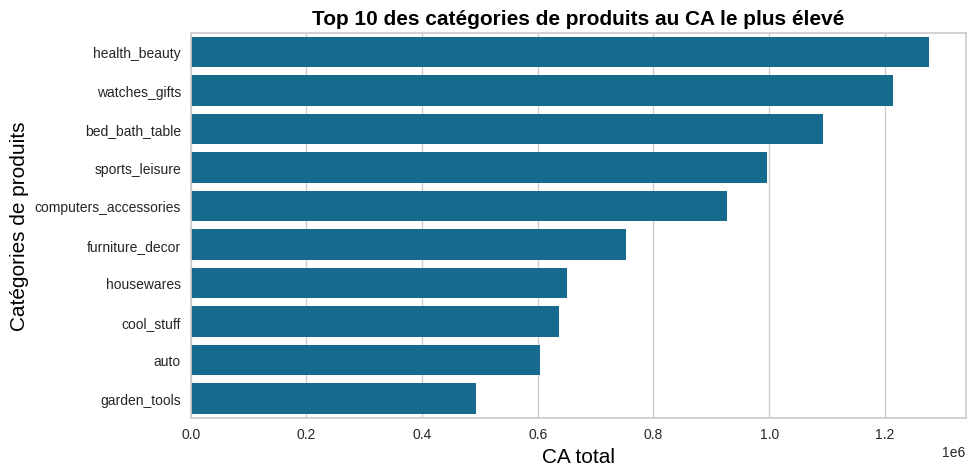

In [83]:
plt.figure(figsize=(10, 5))
sns.barplot(y = top_produits.product_category_name_english.values[:10], x = top_produits.price.values[:10])
plt.xlabel('CA total',color='black',fontsize=15)
plt.ylabel('Catégories de produits',color='black',fontsize=15)
plt.title('Top 10 des catégories de produits au CA le plus élevé',color='black',fontsize=15,fontweight='bold')
plt.show()

* dans l'ensemble on retrouve les mêmes catégories de produits dans le top en volume de vente et en CA, à 2 exceptions près :
    - coll_stuff (top 10 CA uniquement)
    - telephony (top 10 volume de ventes)

##  analyse des paiements


In [84]:
paiements = data_analyse.filter(['order_id', 'payment_sequential', 'payment_type', 'payment_installments', 'payment_value', 'total_prix_fret_produit', 'total_commande'])

#paiements = paiements.sort_values(by='total_nb_produit_commande', ascending= False)
paiements[paiements.payment_installments == 0]

,order_id,payment_sequential,payment_type,payment_installments,payment_value,total_prix_fret_produit,total_commande
15963,10244,2.0,credit_card,0.0,129.94,64.97,129.94
15964,10244,2.0,credit_card,0.0,129.94,64.97,129.94
92791,45168,2.0,credit_card,0.0,58.69,58.69,58.69


In [85]:
paiements.payment_type.value_counts(normalize = True) * 100

payment_type
credit_card    73.774628
boleto         19.447805
voucher         5.341341
debit_card      1.436225
Name: proportion, dtype: float64

In [86]:
paiements.payment_installments.value_counts(normalize = True) * 100

payment_installments
1.0     49.845316
2.0     11.647943
3.0      9.999136
4.0      6.787072
10.0     5.842551
5.0      5.131352
8.0      4.288801
6.0      3.934497
7.0      1.539060
9.0      0.614414
12.0     0.140857
15.0     0.077774
18.0     0.032838
24.0     0.029381
11.0     0.021604
20.0     0.017283
13.0     0.015555
14.0     0.012962
17.0     0.006049
16.0     0.006049
21.0     0.005185
0.0      0.002592
22.0     0.000864
23.0     0.000864
Name: proportion, dtype: float64

In [87]:
x =paiements['payment_installments'].value_counts().sort_index().index
x

Index([ 0.0,  1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0, 10.0, 11.0,
       12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 20.0, 21.0, 22.0, 23.0, 24.0],
      dtype='float64', name='payment_installments')

In [88]:
y = paiements['payment_installments'].value_counts().sort_index().values
y

array([    3, 57681, 13479, 11571,  7854,  5938,  4553,  1781,  4963,
         711,  6761,    25,   163,    18,    15,    90,     7,     7,
          38,    20,     6,     1,     1,    34])

In [89]:
nb_tot_commande = paiements.order_id.nunique()
nb_tot_commande

96478

In [90]:
y_percent = (y/nb_tot_commande*100)
y_percent

array([3.10951720e-03, 5.97866871e+01, 1.39710608e+01, 1.19934078e+01,
       8.14071602e+00, 6.15477104e+00, 4.71921060e+00, 1.84601671e+00,
       5.14417795e+00, 7.36955575e-01, 7.00781525e+00, 2.59126433e-02,
       1.68950434e-01, 1.86571032e-02, 1.55475860e-02, 9.32855159e-02,
       7.25554012e-03, 7.25554012e-03, 3.93872178e-02, 2.07301146e-02,
       6.21903439e-03, 1.03650573e-03, 1.03650573e-03, 3.52411949e-02])

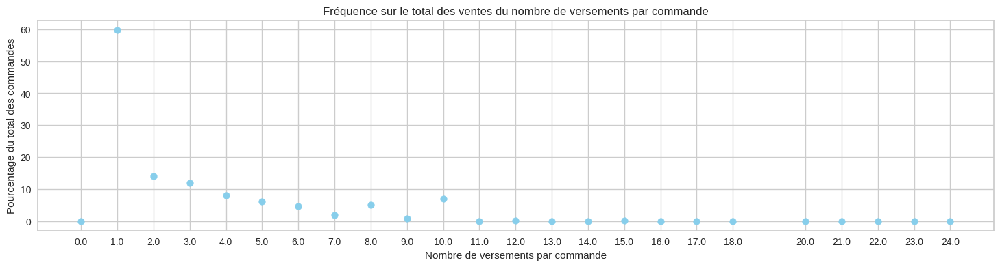

In [91]:
plt.figure(figsize=(18, 4))
plt.scatter(x, y_percent, color='skyblue', marker='o')
plt.title('Fréquence sur le total des ventes du nombre de versements par commande')
plt.xlabel('Nombre de versements par commande')
plt.ylabel('Pourcentage du total des commandes')
plt.xticks(x, x)
plt.grid(True)
plt.show()


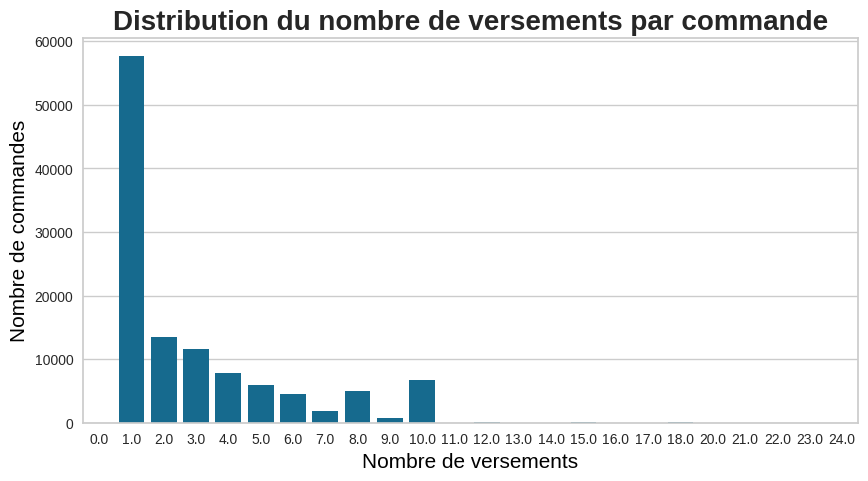

In [92]:
plt.figure(figsize=(10, 5))
sns.countplot(x='payment_installments',data=paiements)
plt.title('Distribution du nombre de versements par commande',fontweight='bold',fontsize=20)
plt.xlabel('Nombre de versements',fontsize=15,color='black')
plt.ylabel('Nombre de commandes',fontsize=15,color='black')
plt.show()

* les clients préfèrent régler leurs achats en carte de crédit, près de 74% des commandes sont réglées ainsi
* Le mode de paiement boleto, représente un peu moins de 20% des achats. les autres types de paiements (voucher et carte de débit) sont marginaux (5% et 1%  respectiveemnt)
* concernant le nombre de réglement, 60% des versements se font en une seule fois.
* le pourcentage chute à moins de 15 % à partir de 2 paiements et reste sur une pente dégressive au-delà de 3 paiements par achat, à l'exception de légers rebonds  pour 8 et 10 paiements, peut-être liés à des offres commerciales ?


## analyse des reviews


In [93]:
data_analyse.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'order_id',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_item_id', 'product_id', 'product_category_name_english',
       'product_description_lenght', 'product_name_lenght', 'product_weight_g',
       'seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp', 'annee', 'mois',
       'jour_semaine', 'heure_commande', 'total_nb_commande_client',
       'total_nb_produit_commande', 'total_prix_fret_produit',
       'total_commande', 'delai_confirmation_commande_min',
       'écart_estimation_livraison_

In [94]:
reviews = data_analyse.filter(['order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date',
                               'review_answer_timestamp', 'delai_reception_review_heure',
       'délai_review_reponse_vendeur_jour', 'lenght_comment', 'lenght_title', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour'])
reviews

,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
0,340,4.0,NaN,NaN,2017-05-26,2017-05-30 22:34:40,13,4,0,0,-11,8
1,15858,5.0,NaN,NaN,2018-01-30,2018-02-10 22:43:29,11,11,0,0,-8,16
2,68985,5.0,NaN,NaN,2018-06-15,2018-06-15 12:10:59,6,0,0,0,1,26
3,57577,5.0,NaN,NaN,2018-03-29,2018-04-02 18:36:47,8,4,0,0,-13,14
4,41738,5.0,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10,2018-08-17 01:59:52,3,7,45,13,-6,11
...,...,...,...,...,...,...,...,...,...,...,...,...
115718,40147,4.0,Recomendo,NaN,2018-04-14,2018-04-28 11:15:04,4,14,0,9,-12,6
115719,61348,5.0,NaN,NaN,2018-04-12,2018-04-16 10:36:05,5,4,0,0,-9,7
115720,99009,1.0,Chateada,Esperava qualidade no atendimento e estou tend...,2018-05-04,2018-05-08 01:41:07,5,4,68,8,7,30
115721,88396,5.0,NaN,NaN,2017-11-17,2017-11-19 23:34:18,4,2,0,0,-19,12


In [95]:
recap_nan(reviews)

Le dataframe sélectionné a 12 colonnes et 115723 lignes.
* Il y a 7 colonnes sans aucune valeur manquante.
* Il y a 5 colonnes avec des valeurs manquantes.
* Parmi ces 5 colonnes, il y a 2 colonnes avec au moins 50% de valeurs manquantes.


,col_names,decompte_NaN,Taux_valeur_manquantes_%
0,review_score,861,0.744018
1,review_creation_date,861,0.744018
2,review_answer_timestamp,861,0.744018
3,review_comment_message,67628,58.439550
4,review_comment_title,102139,88.261625


### review_score sur l'ensemble des commandes

In [96]:
reviews.describe()

,review_score,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
count,114862.000000,114862,114862,115723.000000,115723.000000,115723.000000,115723.000000,115723.000000,115723.000000
mean,4.080488,2018-01-12 19:24:12.104264448,2018-01-15 23:03:56.970486272,7.226213,2.564408,28.913232,1.422708,-12.046456,12.021396
min,1.000000,2016-10-06 00:00:00,2016-10-07 18:32:28,0.000000,0.000000,0.000000,0.000000,-147.000000,0.000000
25%,4.000000,2017-09-23 00:00:00,2017-09-27 12:57:14.249999872,4.000000,1.000000,0.000000,0.000000,-17.000000,6.000000
50%,5.000000,2018-02-02 00:00:00,2018-02-04 19:36:36,6.000000,1.000000,0.000000,0.000000,-13.000000,10.000000
75%,5.000000,2018-05-15 00:00:00,2018-05-20 10:19:44,9.000000,3.000000,43.000000,0.000000,-7.000000,15.000000
max,5.000000,2018-08-31 00:00:00,2018-10-29 12:27:35,24.000000,518.000000,208.000000,26.000000,188.000000,209.000000
std,1.347659,NaN,NaN,5.201565,9.735094,48.953920,4.467848,10.162077,9.454837


In [97]:
review_score = reviews.review_score.value_counts(normalize=True)*100
review_score

review_score
5.0    57.500305
4.0    19.284010
1.0    11.420661
3.0     8.400515
2.0     3.394508
Name: proportion, dtype: float64

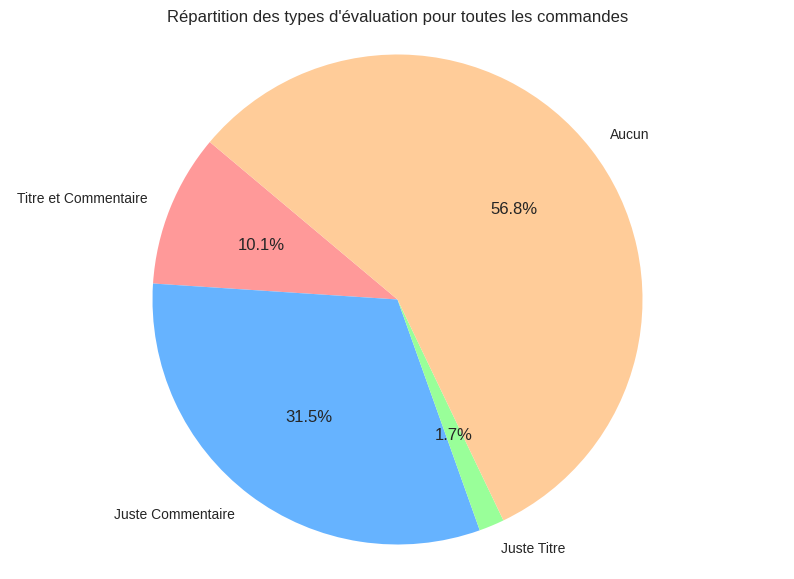

In [98]:
all_reviews_stats = {
    'nb_title_+_comment': 0,
    'just_comment': 0,
    'just_titre': 0,
    'aucun': 0,
    'total_row' :0
    }
# dans les livraison ok compter le nombre de produits avec titres+commentaires, juste titre, juste commentaires et sans rien
for row in reviews.index:
    all_reviews_stats['total_row'] +=1
    comment = reviews['review_comment_message'].loc[row]
    title = reviews['review_comment_title'].loc[row]
    
    if comment is not np.nan and title is not np.nan: # Titre et commentaire présents
        all_reviews_stats['nb_title_+_comment'] += 1
    elif comment is not np.nan and title is np.nan:  # Juste le commentaire présent
        all_reviews_stats['just_comment'] += 1
    elif title is not np.nan and comment is np.nan:  # Juste le titre présent
        all_reviews_stats['just_titre'] += 1
    else:  # Ni titre ni commentaire
        all_reviews_stats['aucun'] += 1

labels = ['Titre et Commentaire', 'Juste Commentaire', 'Juste Titre', 'Aucun']  
sizes = [all_reviews_stats['nb_title_+_comment'], 
         all_reviews_stats['just_comment'], 
         all_reviews_stats['just_titre'], 
         all_reviews_stats['aucun']]
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']

plt.figure(figsize=(10, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Répartition des types d\'évaluation pour toutes les commandes')
plt.axis('equal')  
plt.show()

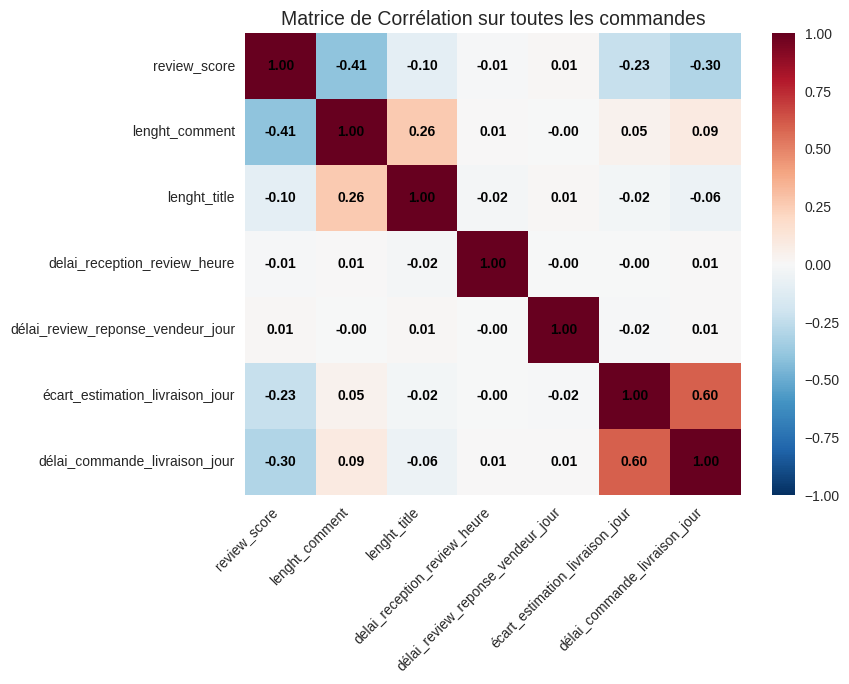

In [99]:
select_review = reviews[['review_score', 'lenght_comment', 'lenght_title', 'delai_reception_review_heure',	'délai_review_reponse_vendeur_jour', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour']]
reviews_corr = select_review.corr()

font= {'color':  'black', 'size': 10, 'weight': 'bold' }

plt.figure(figsize=(8, 6))
sns.heatmap(reviews_corr, 
            #annot=True, 
            cmap='RdBu_r', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 10})
for i in range(len(reviews_corr)):
    for j in range(len(reviews_corr.columns)):
        plt.text(j + 0.5, i + 0.5, f"{reviews_corr.iloc[i, j]:.2f}", ha='center', va='center', fontdict=font)
plt.xticks(rotation=45,  ha='right')
plt.title('Matrice de Corrélation sur toutes les commandes', fontsize= 14)
plt.show()

* sur l'ensemble des commandes :
    - une large majorité des clients est satisfaite de leur commande, près de 58% des clients donnent une note de 5/5 à leur commande
    - la longueur moyenne des commentaires est de 29 caractères	
* avec le pie chart, on note :
    - une large majorité des clients ne laisse ni commentaire ni titre d'évaluation (57%)

* avec la matrice de corrélation, on affine nos observations :
    - l'écart entre la date de livraison et son estimation sont corrélés négativement avec le score de la review (plus l'écart de date de livraison avec son estimation est faible, plus la note augmente)
    - de même pour le délai effectif de livraison (plus le délai est moindre, plus la note augmente)
    - le délai de livraison effectif et l'écart entre la date de livraison et son estimation sont corrélée positivement (plus le délai de livraison augmente, plus l'écart entre la date de livraison et son estimation augmente)
    - la longueur du commentaire et dans une moindre mesure la longueur du titre sont corrélés négativement avec le score de review (plus le score augmente, plus la longueur des textes à tendance à diminuer)
    - la longueur du texte du commentaire et celle du titre sont corrélées positivement (plus le commentaire est long, plus le titre le sera)
    - aucune corrélation avec les dates de création de review et de réponse des vendeurs
* on peut en conclure :
    - que les clients sont globalement plus satisfaits de leur commande quand cell-ci arrive rapidement (délai) et à la date prévue ou en avance (écart avec estimation), et au contraire plus insatisfaits si elle arrive en retard, et ce quelque soit la qualité intrinsèque du produit reçus
    - la longueur des commentaires, et aussi du titre, est un bon indicateur de la satisfaction client
    - en toute logique l'écart avec l'estimation de la livraison est fortement corrélé positivement au délai de livraison, plus l'écart avec l'estimation de livraison augmente plus le délai effectif de livraison augmente

### reviews pour les commandes en retard de livraison

In [100]:
livraison_retard = reviews[reviews.écart_estimation_livraison_jour >0]
livraison_retard.describe()

,review_score,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
count,7367.000000,7367,7367,7558.000000,7558.000000,7558.000000,7558.000000,7558.000000,7558.000000
mean,2.253292,2018-02-12 20:14:53.280847104,2018-02-15 15:48:05.849192192,7.481212,2.222943,48.515877,1.526991,10.573300,33.435830
min,1.000000,2016-10-06 00:00:00,2016-10-07 18:32:28,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
25%,1.000000,2017-12-20 00:00:00,2017-12-21 06:56:33.500000,3.000000,0.000000,0.000000,0.000000,3.000000,24.000000
50%,1.000000,2018-03-17 00:00:00,2018-03-18 18:13:50,6.000000,1.000000,24.000000,0.000000,7.000000,31.000000
75%,4.000000,2018-04-18 00:00:00,2018-04-20 07:28:55,10.000000,2.000000,79.000000,0.000000,13.000000,40.000000
max,5.000000,2018-08-31 00:00:00,2018-10-11 13:34:54,24.000000,284.000000,208.000000,25.000000,188.000000,209.000000
std,1.568655,NaN,NaN,5.955115,8.853933,60.741553,4.903623,14.633844,17.510738


In [101]:
retard_score = livraison_retard.review_score.value_counts(normalize=True)*100
retard_score

review_score
1.0    54.404778
5.0    16.383874
3.0    10.574182
4.0    10.004072
2.0     8.633094
Name: proportion, dtype: float64

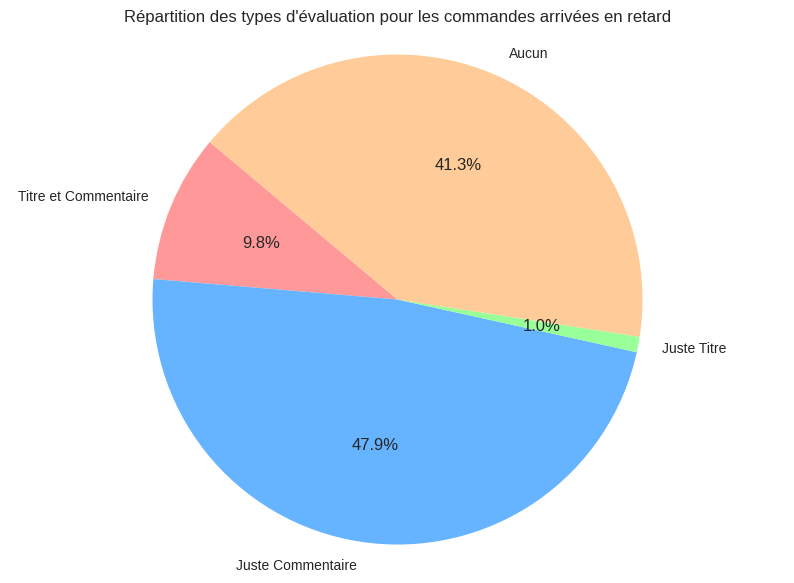

In [102]:
reviews_stats_retard = {
    'nb_title_+_comment': 0,
    'just_comment': 0,
    'just_titre': 0,
    'aucun': 0,
    'total_row' :0
    }
# dans les retards de livraison compter le nombre de produits avec titres+commentaires, juste titre, juste commentaires et sans rien
for row in livraison_retard.index:
    reviews_stats_retard['total_row'] +=1
    comment = livraison_retard['review_comment_message'].loc[row]
    title = livraison_retard['review_comment_title'].loc[row]
    
    if comment is not np.nan and title is not np.nan: # Titre et commentaire présents
        reviews_stats_retard['nb_title_+_comment'] += 1
    elif comment is not np.nan and title is np.nan:  # Juste le commentaire présent
        reviews_stats_retard['just_comment'] += 1
    elif title is not np.nan and comment is np.nan:  # Juste le titre présent
        reviews_stats_retard['just_titre'] += 1
    else:  # Ni titre ni commentaire
        reviews_stats_retard['aucun'] += 1

labels = ['Titre et Commentaire', 'Juste Commentaire', 'Juste Titre', 'Aucun']  
sizes = [reviews_stats_retard['nb_title_+_comment'], 
         reviews_stats_retard['just_comment'], 
         reviews_stats_retard['just_titre'], 
         reviews_stats_retard['aucun']]
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']

plt.figure(figsize=(10, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Répartition des types d\'évaluation pour les commandes arrivées en retard')
plt.axis('equal')  
plt.show()

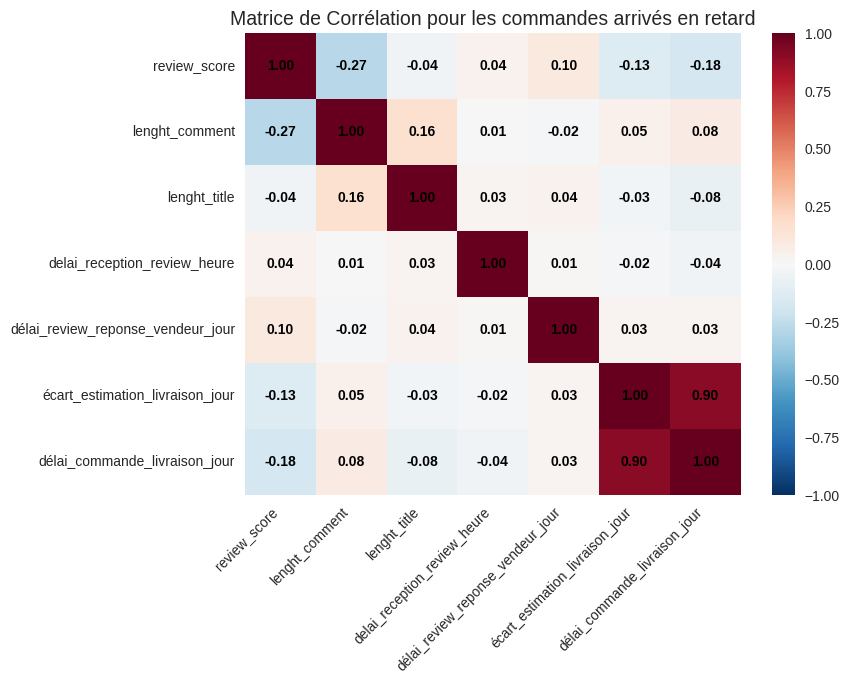

In [103]:
select_review = livraison_retard[['review_score', 'lenght_comment', 'lenght_title', 'delai_reception_review_heure',	'délai_review_reponse_vendeur_jour', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour']]
reviews_corr = select_review.corr()

font= {'color':  'black', 'size': 10, 'weight': 'bold' }

plt.figure(figsize=(8, 6))
sns.heatmap(reviews_corr, 
            #annot=True, 
            cmap='RdBu_r', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 10})
for i in range(len(reviews_corr)):
    for j in range(len(reviews_corr.columns)):
        plt.text(j + 0.5, i + 0.5, f"{reviews_corr.iloc[i, j]:.2f}", ha='center', va='center', fontdict=font)
plt.xticks(rotation=45,  ha='right')
plt.title('Matrice de Corrélation pour les commandes arrivés en retard', fontsize= 14)
plt.show()

### reviews pour les commandes arrivées en avance ou à la date prévue

In [104]:
livraison_ok = reviews[reviews.écart_estimation_livraison_jour <=0]
livraison_ok.describe()

,review_score,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
count,107495.000000,107495,107495,108165.000000,108165.000000,108165.000000,108165.000000,108165.000000,108165.000000
mean,4.205712,2018-01-10 16:21:23.769477632,2018-01-13 20:34:29.283715584,7.208395,2.588268,27.543503,1.415421,-13.627005,10.525068
min,1.000000,2016-10-15 00:00:00,2016-10-16 03:20:17,0.000000,0.000000,0.000000,0.000000,-147.000000,0.000000
25%,4.000000,2017-09-19 00:00:00,2017-09-21 12:27:11,4.000000,1.000000,0.000000,0.000000,-18.000000,6.000000
50%,5.000000,2018-01-30 00:00:00,2018-02-01 15:19:34,6.000000,1.000000,0.000000,0.000000,-13.000000,9.000000
75%,5.000000,2018-05-16 00:00:00,2018-05-20 18:27:32.500000,9.000000,3.000000,40.000000,0.000000,-8.000000,14.000000
max,5.000000,2018-08-31 00:00:00,2018-10-29 12:27:35,24.000000,518.000000,207.000000,26.000000,0.000000,70.000000
std,1.235940,NaN,NaN,5.144346,9.793294,47.722545,4.435731,7.567812,6.319436


In [105]:
ok_score = livraison_ok.review_score.value_counts(normalize=True)*100
ok_score

review_score
5.0    60.318154
4.0    19.919996
1.0     8.474813
3.0     8.251547
2.0     3.035490
Name: proportion, dtype: float64

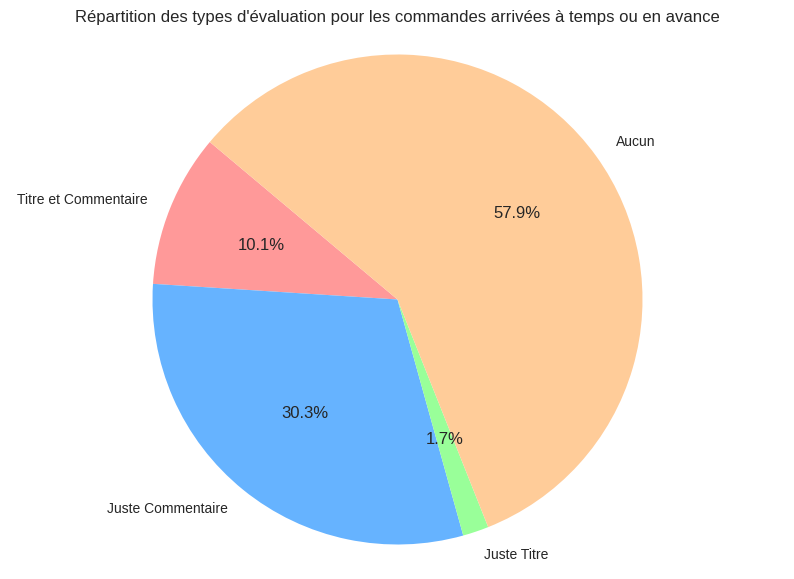

In [106]:
reviews_stats_on_time_early = {
    'nb_title_+_comment': 0,
    'just_comment': 0,
    'just_titre': 0,
    'aucun': 0,
    'total_row' :0
    }
# dans les livraison ok compter le nombre de produits avec titres+commentaires, juste titre, juste commentaires et sans rien
for row in livraison_ok.index:
    reviews_stats_on_time_early['total_row'] +=1
    comment = livraison_ok['review_comment_message'].loc[row]
    title = livraison_ok['review_comment_title'].loc[row]
    
    if comment is not np.nan and title is not np.nan: # Titre et commentaire présents
        reviews_stats_on_time_early['nb_title_+_comment'] += 1
    elif comment is not np.nan and title is np.nan:  # Juste le commentaire présent
        reviews_stats_on_time_early['just_comment'] += 1
    elif title is not np.nan and comment is np.nan:  # Juste le titre présent
        reviews_stats_on_time_early['just_titre'] += 1
    else:  # Ni titre ni commentaire
        reviews_stats_on_time_early['aucun'] += 1

labels = ['Titre et Commentaire', 'Juste Commentaire', 'Juste Titre', 'Aucun']  
sizes = [reviews_stats_on_time_early['nb_title_+_comment'], 
         reviews_stats_on_time_early['just_comment'], 
         reviews_stats_on_time_early['just_titre'], 
         reviews_stats_on_time_early['aucun']]
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']

plt.figure(figsize=(10, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Répartition des types d\'évaluation pour les commandes arrivées à temps ou en avance')
plt.axis('equal')  
plt.show()

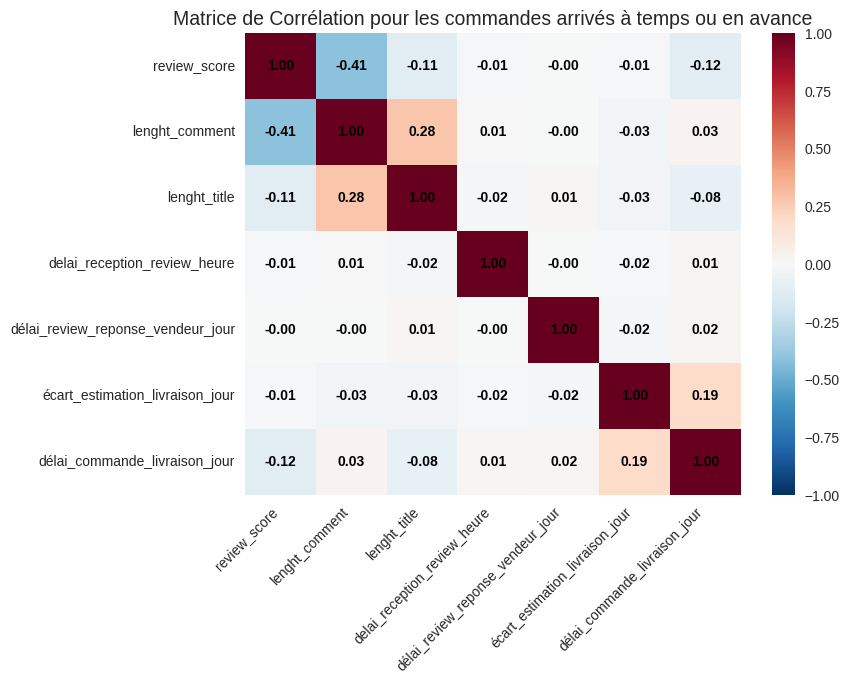

In [107]:
select_review = livraison_ok.filter(['review_score', 'lenght_comment', 'lenght_title', 'delai_reception_review_heure',	'délai_review_reponse_vendeur_jour', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour'])
reviews_corr = select_review.corr()

font= {'color':  'black', 'size': 10, 'weight': 'bold' }

plt.figure(figsize=(8, 6))
sns.heatmap(reviews_corr, 
            #annot=True, 
            cmap='RdBu_r', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 10})
for i in range(len(reviews_corr)):
    for j in range(len(reviews_corr.columns)):
        plt.text(j + 0.5, i + 0.5, f"{reviews_corr.iloc[i, j]:.2f}", ha='center', va='center', fontdict=font)
plt.xticks(rotation=45,  ha='right')
plt.title('Matrice de Corrélation pour les commandes arrivés à temps ou en avance', fontsize= 14)
plt.show()

* la longueur moyenne des commentaires pour des livraisons ok est de 28 caractères. pour des livraisons en retard elle est de 49 caractères.

* entre les commandes en retard ou celles arrivées à temps ou en avance, les clients dont les commandes sont en retard sont plus enclins à laisser une évaluation écrite :
    - 58% des commandes arrivées à temps ou en avance sont sans commentaire ni titre
    - 41% des commmandes en retard sont sans commentaire ni titre
    - pour rappel sur l'ensemble des clients, une large majorité des clients ne laisse ni commentaire ni titre d'évaluation (57%)
    
* avec les matrices de corrélations :
    - le délai de livraison effectif et l'écart entre la date de livraison et son estimation sont corrélée positivement très fortement (0,9) pour les retards de livraison (plus le délai de livraison augmente, plus l'écart entre la date de livraison et son estimation augmente), alors que cette corrélation positive est assez faible (0,2) pour les commandes livrées à temps ou en avance
    - pour les livraisons ok, la longueur des textes des évaluations (commentires + titres) est bien corrélées négativement au score
    - pour les livraisons en retard, le phénomène est identique mais dans une moindre mesure (en cas de retard de livraison, quand la note augmente, la longueur des textes diminuent moins que pour des produits arrivés à temps ou en avance)
    - pour les livraisons ok, il y a une corrélation positive supérieure aux commandes en retard, entre la longueur des titres et la longueur des commentaires
    - aucune corrélation avec les dates de création de review et de réponse des vendeurs


* la fiabilité de la qualité de livraison (livraison à temps) est d'autant plus dégradée s'il s'agit de livraison prévue à une date lointaine.

* un client satisfait aura moins tendance à produire d'évaluation écrite, mais quand il le fera, il ira à l'essentiel : la longueur des textes sera plus courte à mesure que la note est élevée et inversement pour un client insatisfait (la longueur des textes réduisant moins malgré que la note augmente)

* l'insatisfaction des clients s'exprime plus en quantité (nombres d'évaluation écrites) et en qualité (longueur des textes) que leur satisfaction


### focus sur les commandes avec une review complète : score, titre, commentaires

In [108]:
reviews_completed = reviews.dropna(subset=['order_id', 'review_score', 'review_comment_title', 'review_comment_message', 'review_creation_date',
                               'review_answer_timestamp', 'delai_reception_review_heure',
       'délai_review_reponse_vendeur_jour', 'lenght_comment', 'lenght_title', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour'])
reviews_completed.describe()

,review_score,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
count,11656.000000,11656,11656,11656.000000,11656.000000,11656.000000,11656.000000,11656.000000,11656.000000
mean,3.791524,2018-06-26 16:08:04.282772992,2018-06-30 04:08:24.622168832,6.967485,2.917982,70.540494,12.391558,-12.900824,10.191489
min,1.000000,2017-05-16 00:00:00,2018-04-26 12:56:00,0.000000,0.000000,1.000000,1.000000,-55.000000,0.000000
25%,3.000000,2018-05-20 00:00:00,2018-05-23 13:01:04,4.000000,1.000000,29.000000,8.000000,-19.000000,5.000000
50%,5.000000,2018-06-26 00:00:00,2018-06-28 11:16:27,6.000000,1.000000,54.000000,11.000000,-13.000000,8.000000
75%,5.000000,2018-08-03 00:00:00,2018-08-05 14:05:25,9.000000,3.000000,100.000000,17.000000,-7.000000,13.000000
max,5.000000,2018-08-31 00:00:00,2018-10-24 21:34:38,24.000000,411.000000,204.000000,26.000000,60.000000,88.000000
std,1.566471,NaN,NaN,5.219561,11.164522,55.200063,6.334268,10.164985,8.246100


In [109]:
completed_score = reviews_completed.review_score.value_counts(normalize=True)*100
completed_score

review_score
5.0    53.328758
1.0    18.677076
4.0    14.919355
3.0     8.004461
2.0     5.070350
Name: proportion, dtype: float64

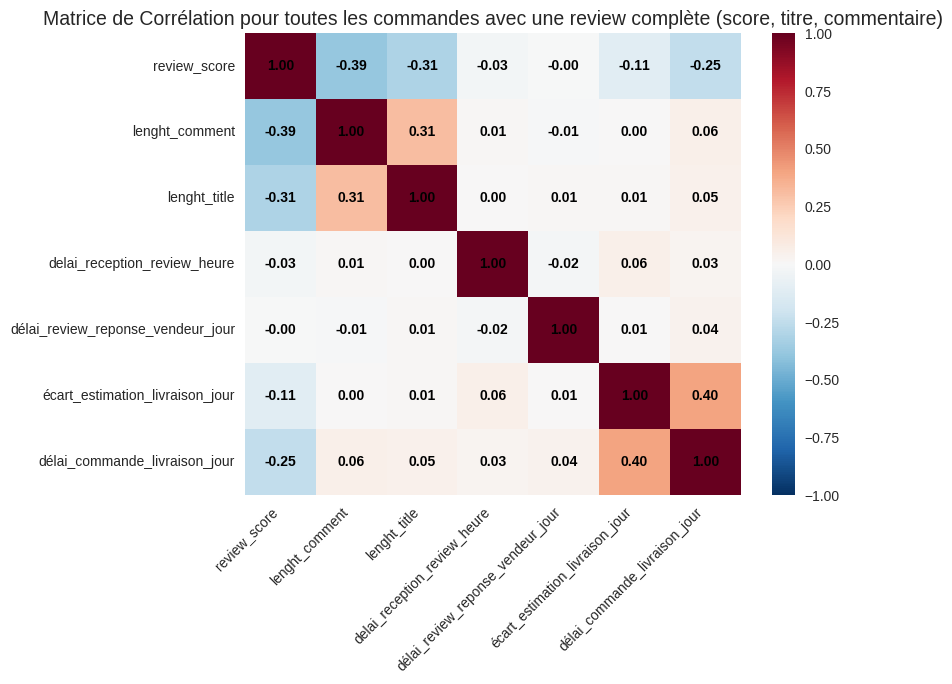

In [110]:
select_review = reviews_completed.filter(['review_score', 'lenght_comment', 'lenght_title', 'delai_reception_review_heure',	'délai_review_reponse_vendeur_jour', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour'])
reviews_corr = select_review.corr()

font= {'color':  'black', 'size': 10, 'weight': 'bold' }

plt.figure(figsize=(8, 6))
sns.heatmap(reviews_corr, 
            #annot=True, 
            cmap='RdBu_r', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 10})
for i in range(len(reviews_corr)):
    for j in range(len(reviews_corr.columns)):
        plt.text(j + 0.5, i + 0.5, f"{reviews_corr.iloc[i, j]:.2f}", ha='center', va='center', fontdict=font)
plt.xticks(rotation=45,  ha='right')
plt.title('Matrice de Corrélation pour toutes les commandes avec une review complète (score, titre, commentaire)', fontsize= 14)
plt.show()

* sur l'ensemble des commandes avec reviews complète :
    - une large majorité des clients est satisfaite de leur commande, près de 53% des clients donnent une note de 5/5 à leur commande, mais 5% de moins que sur l'ensemble des commandes avec ou sans review
    - la moyenne des score est d'ailleurs inférieure passant de 4,08 sur l'ensemble des commandes à 3,79 sur les commandes avec reviews complète
    - la longueur moyenne des commentaires est aussi bien plus  importantes 70 caractères de 29 caractères	(logique que la moyenne augmente puis que nous supprimons les commandes sans review)

* avec la matrice de corrélation, on affine nos observations :
    - l'écart entre la date de livraison et son estimation sont corrélés plus négativement avec le score de la review (plus l'écart de date de livraison avec son estimation est faible, plus la note augmente)
    - de même pour le délai effectif de livraison (plus le délai est moindre, plus la note augmente), de manière plus franche que sur l'ensemble des reviews
    - le délai de livraison effectif et l'écart entre la date de livraison et son estimation sont corrélée positivement (plus le délai de livraison augmente, plus l'écart entre la date de livraison et son estimation augmente)
    - la longueur du commentaire et dans une moindre mesure la longueur du titre sont corrélés négativement avec le score de review (plus le score augmente, plus la longueur des textes à tendance à diminuer) de manière plus marquée pour le titre que sur l'ensemble des commmandes
    - la longueur du texte du commentaire et celle du titre sont corrélées positivement (plus le commentaire est long, plus le titre le sera)
    - aucune corrélation avec les dates de création de review et de réponse des vendeurs
* on peut en conclure :
    - en se concentrant sur les commandes avec reviews complètes, on observe que le client insatisafait s'exprime plus de manière générale (ce que nous avions déjà constaté sur l'ensemble des commandes)

#### pour celles en retard de livraison 

In [111]:
livraison_retard_complet = reviews_completed[reviews_completed.écart_estimation_livraison_jour >0]
livraison_retard_complet.describe()

,review_score,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
count,739.000000,739,739,739.000000,739.000000,739.000000,739.000000,739.000000,739.000000
mean,2.205683,2018-06-25 02:37:50.094722560,2018-06-29 01:22:08.807848448,7.920162,3.399188,81.323410,14.231394,8.407307,28.230041
min,1.000000,2018-03-09 00:00:00,2018-04-26 13:08:01,0.000000,0.000000,1.000000,1.000000,1.000000,3.000000
25%,1.000000,2018-05-24 00:00:00,2018-05-26 09:20:07.500000,4.000000,0.000000,34.000000,9.000000,3.000000,18.000000
50%,1.000000,2018-06-09 00:00:00,2018-06-11 13:37:42,6.000000,1.000000,63.000000,15.000000,6.000000,27.000000
75%,3.000000,2018-08-11 00:00:00,2018-08-12 15:51:28.500000,10.000000,3.000000,120.000000,20.000000,11.000000,37.000000
max,5.000000,2018-08-31 00:00:00,2018-10-11 13:34:54,24.000000,204.000000,203.000000,25.000000,60.000000,88.000000
std,1.541976,NaN,NaN,6.192737,11.716111,58.528034,6.548074,8.338405,14.319377


In [112]:
completed_score_retard = livraison_retard_complet.review_score.value_counts(normalize=True)*100
completed_score_retard

review_score
1.0    55.074425
5.0    15.290934
3.0    10.554804
4.0     9.607578
2.0     9.472260
Name: proportion, dtype: float64

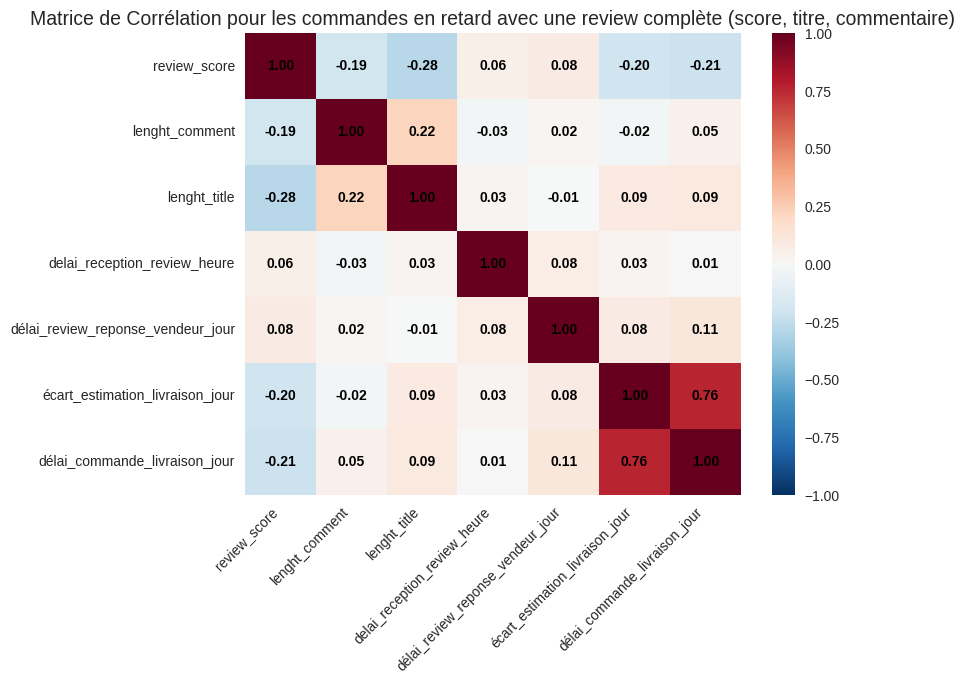

In [113]:
select_review = livraison_retard_complet.filter(['review_score', 'lenght_comment', 'lenght_title', 'delai_reception_review_heure',	'délai_review_reponse_vendeur_jour', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour'])
reviews_corr = select_review.corr()

font= {'color':  'black', 'size': 10, 'weight': 'bold' }

plt.figure(figsize=(8, 6))
sns.heatmap(reviews_corr, 
            #annot=True, 
            cmap='RdBu_r', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 10})
for i in range(len(reviews_corr)):
    for j in range(len(reviews_corr.columns)):
        plt.text(j + 0.5, i + 0.5, f"{reviews_corr.iloc[i, j]:.2f}", ha='center', va='center', fontdict=font)
plt.xticks(rotation=45,  ha='right')
plt.title('Matrice de Corrélation pour les commandes en retard avec une review complète (score, titre, commentaire)', fontsize= 14)
plt.show()

#### pour celles en avance ou à temps 

In [114]:
livraison_ok_complet = reviews_completed[reviews_completed.écart_estimation_livraison_jour <=0]
livraison_ok_complet.describe()

,review_score,review_creation_date,review_answer_timestamp,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title,écart_estimation_livraison_jour,délai_commande_livraison_jour
count,10917.000000,10917,10917,10917.000000,10917.000000,10917.000000,10917.000000,10917.000000,10917.000000
mean,3.898873,2018-06-26 18:40:23.742786304,2018-06-30 05:57:08.550609152,6.902995,2.885408,69.810571,12.267015,-14.343226,8.970413
min,1.000000,2017-05-16 00:00:00,2018-04-26 12:56:00,0.000000,0.000000,1.000000,1.000000,-55.000000,0.000000
25%,3.000000,2018-05-20 00:00:00,2018-05-23 11:53:11,4.000000,1.000000,28.000000,8.000000,-20.000000,5.000000
50%,5.000000,2018-06-26 00:00:00,2018-06-28 20:59:21,6.000000,1.000000,53.000000,11.000000,-13.000000,8.000000
75%,5.000000,2018-08-02 00:00:00,2018-08-04 20:47:32,9.000000,3.000000,98.000000,17.000000,-8.000000,12.000000
max,5.000000,2018-08-31 00:00:00,2018-10-24 21:34:38,24.000000,411.000000,204.000000,26.000000,0.000000,51.000000
std,1.509114,NaN,NaN,5.140997,11.126005,54.893840,6.300455,8.532464,5.934597


In [115]:
completed_score_retard = livraison_ok_complet.review_score.value_counts(normalize=True)*100
completed_score_retard

review_score
5.0    55.903637
1.0    16.213245
4.0    15.278923
3.0     7.831822
2.0     4.772373
Name: proportion, dtype: float64

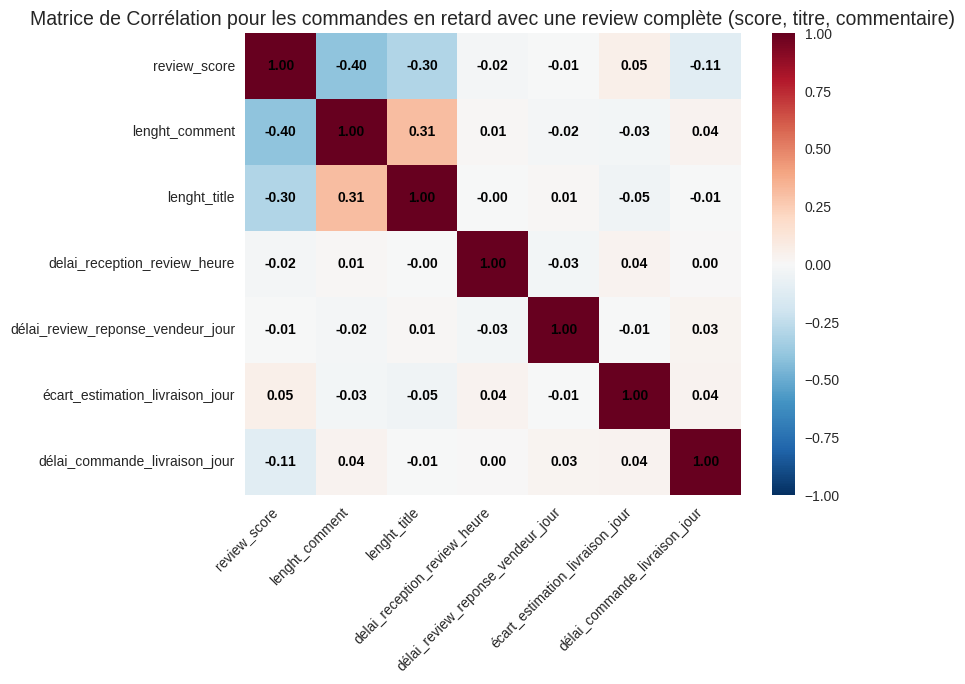

In [116]:
select_review = livraison_ok_complet.filter(['review_score', 'lenght_comment', 'lenght_title', 'delai_reception_review_heure',	'délai_review_reponse_vendeur_jour', 'écart_estimation_livraison_jour', 'délai_commande_livraison_jour'])
reviews_corr = select_review.corr()

font= {'color':  'black', 'size': 10, 'weight': 'bold' }

plt.figure(figsize=(8, 6))
sns.heatmap(reviews_corr, 
            #annot=True, 
            cmap='RdBu_r', fmt=".2f", vmin=-1, vmax=1, annot_kws={"size": 10})
for i in range(len(reviews_corr)):
    for j in range(len(reviews_corr.columns)):
        plt.text(j + 0.5, i + 0.5, f"{reviews_corr.iloc[i, j]:.2f}", ha='center', va='center', fontdict=font)
plt.xticks(rotation=45,  ha='right')
plt.title('Matrice de Corrélation pour les commandes en retard avec une review complète (score, titre, commentaire)', fontsize= 14)
plt.show()

## Ventes globales sur OLIST

### en volume de ventes par an

In [117]:
data_analyse.sort_values(by='order_purchase_timestamp')

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,total_nb_produit_commande,total_prix_fret_produit,total_commande,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title
24664,52277,49312,14600,sao joaquim da barra,SP,74448,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-09 07:47:38,2016-10-04,...,3,47.82,143.46,0,36,54,16,1,46,0
24663,52277,49312,14600,sao joaquim da barra,SP,74448,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-09 07:47:38,2016-10-04,...,3,47.82,143.46,0,36,54,16,1,46,0
24662,52277,49312,14600,sao joaquim da barra,SP,74448,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-09 07:47:38,2016-10-04,...,3,47.82,143.46,0,36,54,16,1,46,0
45038,20701,19160,4106,sao paulo,SP,23062,2016-10-03 09:44:50,2016-10-06 15:50:54,2016-10-26 14:02:13,2016-10-27,...,1,45.46,45.46,366,-1,23,10,4,34,0
64194,49183,17870,98280,panambi,RS,73921,2016-10-03 16:56:50,2016-10-06 16:03:44,2016-10-27 18:19:38,2016-11-07,...,1,39.09,39.09,1387,-11,24,6,1,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98505,89525,34825,80045,curitiba,PR,4355,2018-08-29 14:18:23,2018-08-29 14:31:07,2018-08-30 16:24:55,2018-09-04,...,2,255.48,510.96,13,-5,1,8,54,0,0
98506,89525,34825,80045,curitiba,PR,4355,2018-08-29 14:18:23,2018-08-29 14:31:07,2018-08-30 16:24:55,2018-09-04,...,2,255.48,510.96,13,-5,1,8,54,0,0
563,42629,48133,38600,paracatu,MG,8711,2018-08-29 14:18:28,2018-08-29 14:30:23,2018-08-30 16:52:31,2018-09-11,...,1,61.29,61.29,12,-12,1,7,2,10,24
58045,28460,68797,9541,sao caetano do sul,SP,1533,2018-08-29 14:52:00,2018-08-29 15:05:22,2018-08-30 16:36:59,2018-09-03,...,1,33.23,33.23,13,-4,1,7,0,0,9


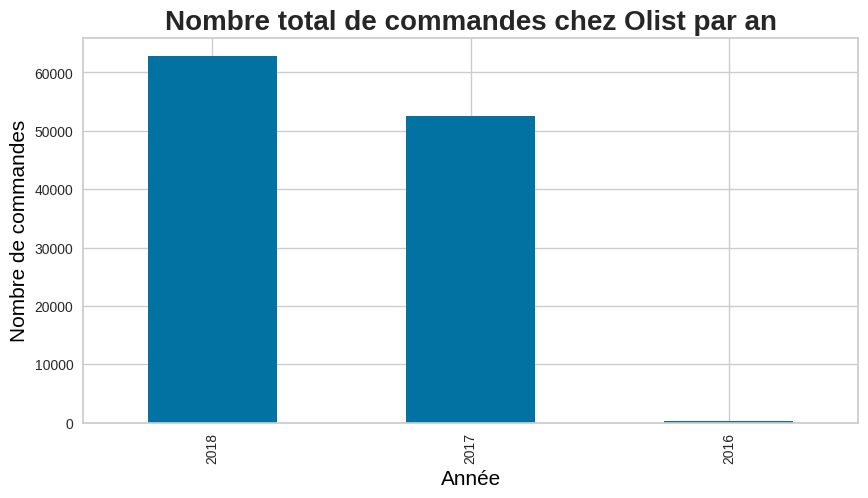

In [118]:
plt.figure(figsize=(10, 5))
pd.to_datetime(data_analyse.order_purchase_timestamp).dt.year.value_counts().plot(kind='bar')
plt.title('Nombre total de commandes chez Olist par an',fontweight='bold',fontsize=20)
plt.xlabel('Année',fontsize=15,color='black')
plt.ylabel('Nombre de commandes',fontsize=15,color='black')
plt.show()

* on note une augmetation du volume de vente en 2018 par rapport à 2017 
* à noter que l'année 2016 dans les données n'est pas complète, les premières commandes datent du 15 septembre 2016, ainsi que 2018 les données s'arrêtent le 29 aout
* on peut néanmoins en déduire une augmentation de l'activité d'année en année

### en volume de ventes et CA par mois et par an

In [119]:
def calculate_revenue_by_year(data, year):
    """
    Calcule les revenus agrégés par mois pour une année donnée.

    Parameters:
    data (DataFrame): Le DataFrame contenant les données.
    year (int): L'année pour laquelle calculer les revenus.

    Return:
    DataFrame: Un DataFrame avec les revenus agrégés par mois pour l'année spécifiée.
    """
    year_data = data[data.annee == year]
    revenu_annuel = year_data.groupby('mois').agg({'order_id': 'nunique', 'total_commande': 'sum'})
    return revenu_annuel


In [120]:
revenu2016 = calculate_revenue_by_year(data_analyse, 2016)
revenu2016

,order_id,total_commande
mois,,
9,1,430.38
10,265,70190.32
12,1,19.62


In [121]:
revenu2017 = calculate_revenue_by_year(data_analyse, 2017)
revenu2017

,order_id,total_commande
mois,,
1,750,262316.10
2,1653,410985.04
3,2546,770103.53
4,2303,562043.34
5,3546,1077522.48
6,3135,767658.05
7,3872,1063875.68
8,4193,1213443.03
9,4150,1393707.90


In [122]:
revenu2018 = calculate_revenue_by_year(data_analyse, 2018)
revenu2018

,order_id,total_commande
mois,,
1,7069,1621144.83
2,6555,1692215.27
3,7003,1699291.67
4,6798,1681694.60
5,6749,1749731.45
6,6099,1630414.60
7,6159,1503679.64
8,6351,1373159.87


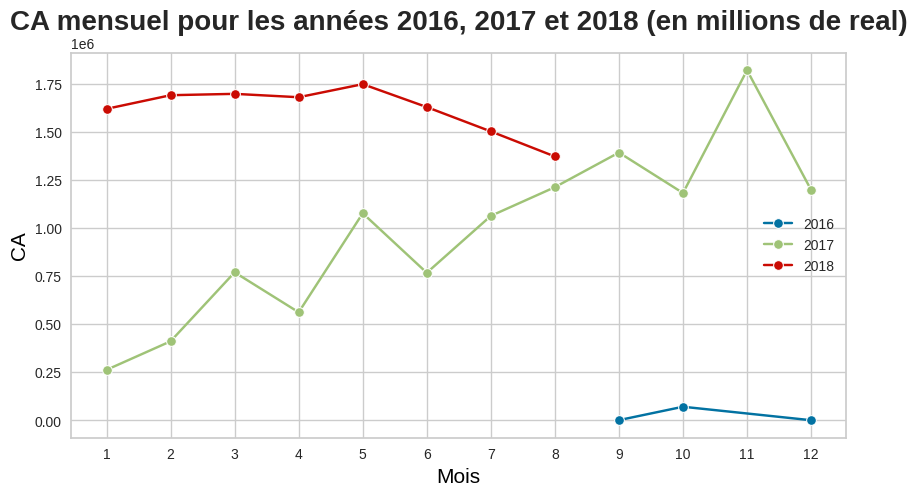

In [123]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenu2016['total_commande'], x = revenu2016.index, marker = 'o', label = '2016')
sns.lineplot(y = revenu2017['total_commande'], x = revenu2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenu2018['total_commande'], x = revenu2018.index, marker = 'o', label = '2018')
plt.title('CA mensuel pour les années 2016, 2017 et 2018 (en millions de real)',fontweight='bold',fontsize=20)
plt.xlabel('Mois',fontsize=15,color='black')
plt.ylabel('CA',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

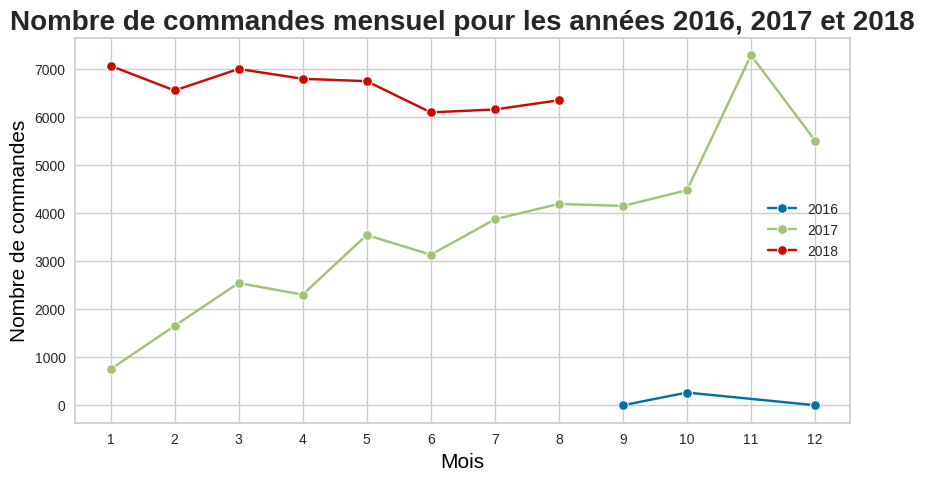

In [124]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenu2016['order_id'], x = revenu2016.index, marker = 'o', label = '2016')
sns.lineplot(y = revenu2017['order_id'], x = revenu2017.index, marker = 'o', label = '2017')
sns.lineplot(y = revenu2018['order_id'], x = revenu2018.index, marker = 'o', label = '2018')
plt.title('Nombre de commandes mensuel pour les années 2016, 2017 et 2018',fontweight='bold',fontsize=20)
plt.xlabel('Mois',fontsize=15,color='black')
plt.ylabel('Nombre de commandes',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

* on observe un pic de commandes sur novembre et décembre 2017, certainement dû aux achats pour les fêtes de fin d'année
* la croissance en volume et en CA est très nette, on voit bien que le début d'année 2018 est bien au-dessus de la même période en 2017, tant en CA qu'en volume de ventes

### analyse jour de la semaine  


In [125]:
data_analyse.head(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,total_nb_produit_commande,total_prix_fret_produit,total_commande,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title
0,2610,50396,14409,franca,SP,340,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-25 10:35:35,2017-06-05,...,1,146.87,146.87,17,-11,8,13,4,0,0
1,9561,15433,9790,sao bernardo do campo,SP,15858,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-29 12:41:19,2018-02-06,...,1,335.48,335.48,10,-8,16,11,11,0,0
2,30460,2272,1151,sao paulo,SP,68985,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-14 17:58:51,2018-06-13,...,1,157.73,157.73,11,1,26,6,0,0,0
3,69605,14192,8775,mogi das cruzes,SP,57577,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-28 16:04:25,2018-04-10,...,1,173.30,173.30,83,-13,14,8,4,0,0
4,30707,19733,13056,campinas,SP,41738,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-08-09 20:55:48,2018-08-15,...,1,252.25,252.25,19,-6,11,3,7,45,13


/tmp/ipykernel_195350/541981215.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data_analyse.groupby(['jour_semaine']).agg({'order_id' : 'count'}).plot(kind = 'barh', figsize = (10, 5))


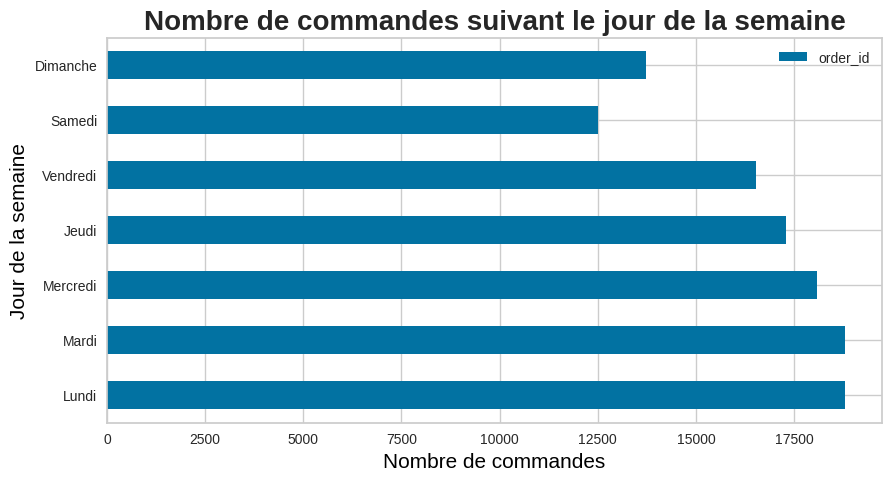

In [126]:
data_analyse.groupby(['jour_semaine']).agg({'order_id' : 'count'}).plot(kind = 'barh', figsize = (10, 5))
plt.title('Nombre de commandes suivant le jour de la semaine',fontweight='bold',fontsize=20)
plt.xlabel('Nombre de commandes',fontsize=15,color='black')
plt.ylabel('Jour de la semaine',fontsize=15,color='black') 
plt.show()


* les jours où il y a le plus de commandes sont le lundi et le mardi, avec une diminution du volume de vente tout au long de la semaine, jusqu'au samedi, le jour de la semaine avec le moins de commande, et un léger rebond des commandes le dimanche
* la clientèle d'olist est peu disponible pour passer commande le we

### analyse heure de la journée

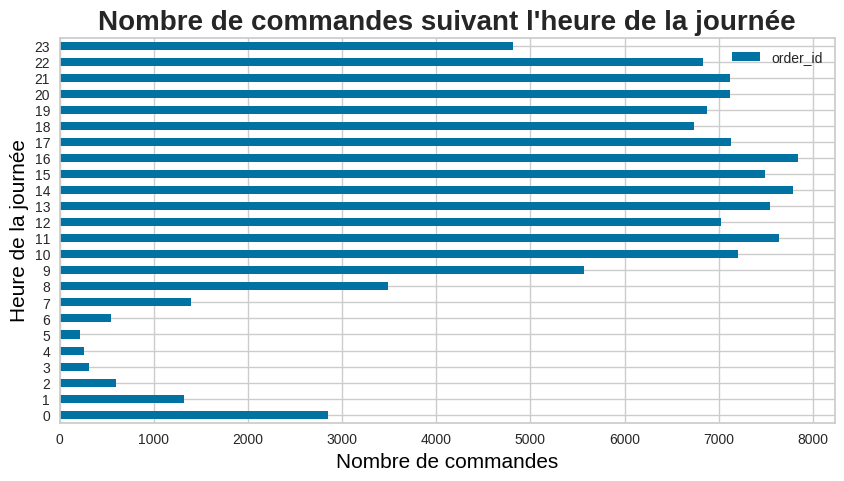

In [127]:
data_analyse.groupby(['heure_commande']).agg({'order_id' : 'count'}).plot(kind = 'barh', figsize = (10, 5))
plt.title('Nombre de commandes suivant l\'heure de la journée',fontweight='bold',fontsize=20)
plt.xlabel('Nombre de commandes',fontsize=15,color='black')
plt.ylabel('Heure de la journée',fontsize=15,color='black')
plt.show()


* 16h, 14h et 11h sont les 3 heures de la journée où les clients commandes le plus;
* de manière générale, les heures comprises entre 10h et 22h sont celle avec une activité élevée
* les heures de nuit, de minuit à 7h, sont en toute logique peu propices à la vente

In [128]:
data_analyse.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115723 entries, 0 to 115722
Data columns (total 47 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   customer_id                        115723 non-null  object        
 1   customer_unique_id                 115723 non-null  object        
 2   customer_zip_code_prefix           115723 non-null  object        
 3   customer_city                      115723 non-null  object        
 4   customer_state                     115723 non-null  object        
 5   order_id                           115723 non-null  object        
 6   order_purchase_timestamp           115723 non-null  datetime64[ns]
 7   order_approved_at                  115708 non-null  datetime64[ns]
 8   order_delivered_customer_date      115715 non-null  datetime64[ns]
 9   order_estimated_delivery_date      115723 non-null  datetime64[ns]
 10  order_item_id       

# RFM - features

## RFM - récense

La récence est calculée en soustrayant la dernière date de commande disponible dans l'ensemble de données à la dernière date d'achat de chaque client. elle est exprimée en nombres de jours

In [130]:
data_analyse.order_purchase_timestamp.min()

Timestamp('2016-09-15 12:16:38')

In [131]:
data_analyse.order_purchase_timestamp.max()

Timestamp('2018-08-29 15:00:37')

In [129]:
recence = data_analyse.groupby('customer_unique_id', as_index=False)['order_purchase_timestamp'].max()
recence.rename(columns={'order_purchase_timestamp':'deniere_date_commande'},inplace = True)
recence.head()


,customer_unique_id,deniere_date_commande
0,0,2018-05-10 10:56:27
1,1,2018-05-07 11:11:27
2,2,2017-03-10 21:05:03
3,3,2017-10-12 20:29:41
4,4,2017-11-14 19:45:42


In [131]:
recent_date = data_analyse['order_purchase_timestamp'].dt.date.max()
print('La date de la plus récente de commande disponible dans le dataset est : ', recent_date)

La date de la plus récente de commande disponible dans le dataset est :  2018-08-29


In [132]:
recence['recence'] = recence['deniere_date_commande'].dt.date.apply(lambda x: (recent_date - x).days)
recence.head()

,customer_unique_id,deniere_date_commande,recence
0,0,2018-05-10 10:56:27,111
1,1,2018-05-07 11:11:27,114
2,2,2017-03-10 21:05:03,537
3,3,2017-10-12 20:29:41,321
4,4,2017-11-14 19:45:42,288


## RFM - fréquence

La fréquence est calculée en comptant le nombre commandes passées par chaque client. nous l'avons déjà calculé

In [133]:
frequency = data_analyse.groupby('customer_unique_id', as_index=False)['total_nb_commande_client'].max()
frequency.rename(columns={'total_nb_commande_client':'frequence'},inplace=True)
frequency.head()

,customer_unique_id,frequence
0,0,1
1,1,1
2,2,1
3,3,1
4,4,1


## RFM - montant


Le "montant" (= valeur monétaire de chaque client) est calculée en additionnant le montant dépensé total sur toutes les commandes de chaque client.  

In [134]:
commandes = data_analyse.groupby('order_id', as_index=False).first()
montant = commandes.groupby('customer_unique_id', as_index=False)['total_commande'].sum()
montant.rename(columns={'total_commande': 'montant'}, inplace=True)

montant.head()

,customer_unique_id,montant
0,0,141.90
1,1,27.19
2,2,86.22
3,3,43.62
4,4,196.89


In [135]:
montant[montant.customer_unique_id == 79467]

,customer_unique_id,montant
77211,79467,141.07


In [136]:
commandes.columns

Index(['order_id', 'customer_id', 'customer_unique_id',
       'customer_zip_code_prefix', 'customer_city', 'customer_state',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_item_id', 'product_id', 'product_category_name_english',
       'product_description_lenght', 'product_name_lenght', 'product_weight_g',
       'seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'shipping_limit_date', 'price', 'freight_value', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_score',
       'review_comment_title', 'review_comment_message',
       'review_creation_date', 'review_answer_timestamp', 'annee', 'mois',
       'jour_semaine', 'heure_commande', 'total_nb_commande_client',
       'total_nb_produit_commande', 'total_prix_fret_produit',
       'total_commande', 'delai_confirmation_commande_min',
       'écart_estimation_livraison_

In [137]:
commandes[commandes.total_nb_commande_client == 2][commandes.total_nb_produit_commande == 2]

/tmp/ipykernel_142770/3352038139.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  commandes[commandes.total_nb_commande_client == 2][commandes.total_nb_produit_commande == 2]


,order_id,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,total_nb_produit_commande,total_prix_fret_produit,total_commande,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title
145,148,20271,79467,78045,cuiaba,MT,2018-01-22 19:46:58,2018-01-24 02:53:04,2018-02-08 18:39:13,2018-02-20,...,2,51.69,103.38,426,-12,16,5,1,200,0
313,322,61168,31585,57303,arapiraca,AL,2017-05-01 14:11:11,2017-05-01 14:25:13,2017-05-23 05:55:05,2017-06-05,...,2,48.70,97.40,14,-13,21,18,2,0,0
369,379,55296,68309,28470,santo antonio de padua,RJ,2017-09-26 14:49:01,2017-09-26 17:07:16,2017-10-09 15:15:38,2017-10-24,...,2,206.09,412.18,138,-15,13,9,0,5,0
443,454,36680,80752,29305,cachoeiro de itapemirim,ES,2018-05-04 21:18:05,2018-05-04 21:33:37,2018-05-12 12:58:39,2018-06-01,...,2,53.90,107.80,16,-20,7,11,19,0,0
547,565,78878,63558,4130,sao paulo,SP,2018-05-15 17:33:50,2018-05-15 17:54:29,2018-05-17 14:24:29,2018-05-29,...,2,57.19,114.38,21,-12,1,10,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95032,97953,87562,62538,94030,gravatai,RS,2018-05-21 21:34:55,2018-05-22 00:16:52,2018-06-07 20:37:50,2018-06-19,...,2,76.29,152.58,162,-12,16,3,3,0,10
95046,97969,63004,60479,18760,cerqueira cesar,SP,2017-12-12 18:19:22,2017-12-12 18:31:26,2017-12-26 19:42:53,2018-01-05,...,2,43.85,87.70,12,-10,14,4,1,51,0
95616,98553,3427,86991,5444,sao paulo,SP,2018-03-21 10:59:55,2018-03-21 11:10:40,2018-04-02 19:24:54,2018-04-09,...,2,62.71,125.42,11,-7,12,5,1,0,0
95735,98677,64898,7047,38050,uberaba,MG,2017-12-13 17:35:27,2017-12-15 02:17:46,2018-01-03 17:37:19,2018-01-15,...,2,521.73,1043.46,522,-12,21,6,0,52,0


In [138]:
commandes[commandes.customer_unique_id == 79467]

,order_id,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,...,total_nb_produit_commande,total_prix_fret_produit,total_commande,delai_confirmation_commande_min,écart_estimation_livraison_jour,délai_commande_livraison_jour,delai_reception_review_heure,délai_review_reponse_vendeur_jour,lenght_comment,lenght_title
145,148,20271,79467,78045,cuiaba,MT,2018-01-22 19:46:58,2018-01-24 02:53:04,2018-02-08 18:39:13,2018-02-20,...,2,51.69,103.38,426,-12,16,5,1,200,0
81305,83774,91153,79467,78045,cuiaba,MT,2018-01-22 19:46:58,2018-01-24 02:53:17,2018-02-08 13:13:01,2018-02-20,...,1,37.69,37.69,426,-12,16,11,1,200,0


In [139]:
data_analyse.total_commande.min()

10.07

In [140]:
data_analyse.total_commande.max()

13664.08

In [141]:
montant.montant.min()

10.07

In [142]:
montant.montant.max()

13664.08

# RFM - analyse

analysons les données nécessaires pour choisir la meilleure méthode de segemntation des données (discrétisation des données brutes ou méthode des quartiles)

## RFM Analyse Récence

In [143]:
rfm = recence.merge(frequency, on='customer_unique_id')
rfm = rfm.merge(montant, on='customer_unique_id').drop(columns='deniere_date_commande')
rfm.head()

,customer_unique_id,recence,frequence,montant
0,0,111,1,141.90
1,1,114,1,27.19
2,2,537,1,86.22
3,3,321,1,43.62
4,4,288,1,196.89


In [144]:
rfm[rfm.recence == 0]

,customer_unique_id,recence,frequence,montant
1510,1551,0,1,119.42
4587,4710,0,1,178.25
12426,12791,0,1,14.29
13433,13835,0,1,93.75
33812,34825,0,1,510.96
44590,45917,0,1,73.10
46739,48133,0,1,61.29
64218,66111,0,1,497.25
66047,67996,0,1,106.95
66821,68797,0,1,33.23


* La colonne de récence avait une valeur de 0, c'est-à-dire qu'un client est arrivé le dernier jour de la date que nous avons prise comme seuil pour calculer la récence.
La valeur 0 de la récence doit être traitée comme un outlier pour créer la variable cible, c'est-à-dire le taux de désabonnement, et pour le processus ultérieur de mise à l'échelle ou de normalisation, de sorte que la valeur 0 est convertie en valeur 1 pour des raisons de commodité.

In [145]:
rfm['recence'] = rfm.recence.apply(lambda x: 1 if x == 0 else x)
rfm.head()

,customer_unique_id,recence,frequence,montant
0,0,111,1,141.90
1,1,114,1,27.19
2,2,537,1,86.22
3,3,321,1,43.62
4,4,288,1,196.89


/tmp/ipykernel_142770/3762769992.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(rfm.recence)


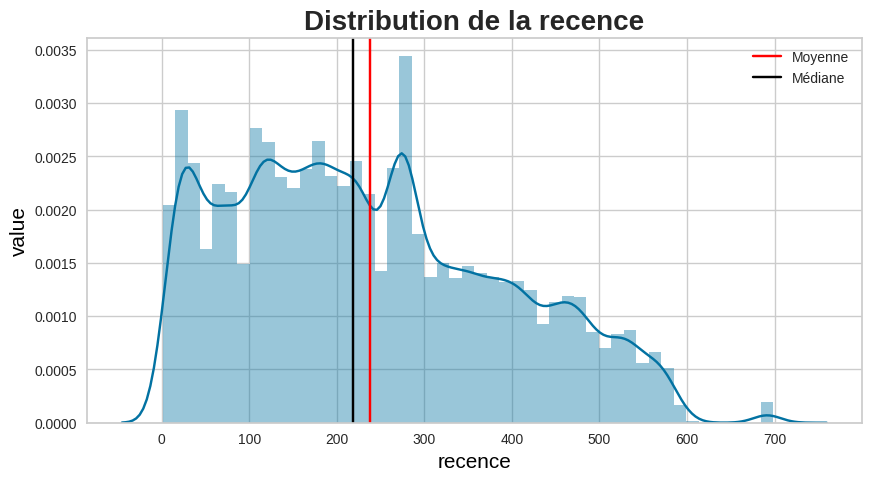

moyenne de la recence:  237.47899483707877
médiane de la  recence:  218.0
asymétrie de la recence:  0.44749168301709485


In [146]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.recence)
plt.axvline(rfm.recence.mean(), c = 'red', label='Moyenne')
plt.axvline(rfm.recence.median(), c = 'black', label='Médiane')
plt.title('Distribution de la recence',fontweight='bold',fontsize=20)
plt.xlabel('recence',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.legend()
plt.show()
print('moyenne de la recence: ', rfm.recence.mean())
print('médiane de la  recence: ', rfm.recence.median())
print('asymétrie de la recence: ', rfm.recence.skew())

* la distribution de la récence est asymétrique positive :
    - asymétrique car skewness=0,45 > 0
    - moyenne légèrement supérieure à la médiane 
* la présence de valeurs maximales extrèmes augmentent la moyenne, bien que la majorité des données restent inférieure à celle-ci
* la moyenne de la récence est donc peu représentative des données, car trop influencée par les valeurs extrèmes.
* pour notre segmentation rfm, nous utiliserons donc la médiane et les autres quartiles pour créer nos rangs




## RFM Analyse Fréquence

/tmp/ipykernel_142770/1957172869.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(rfm.frequence)


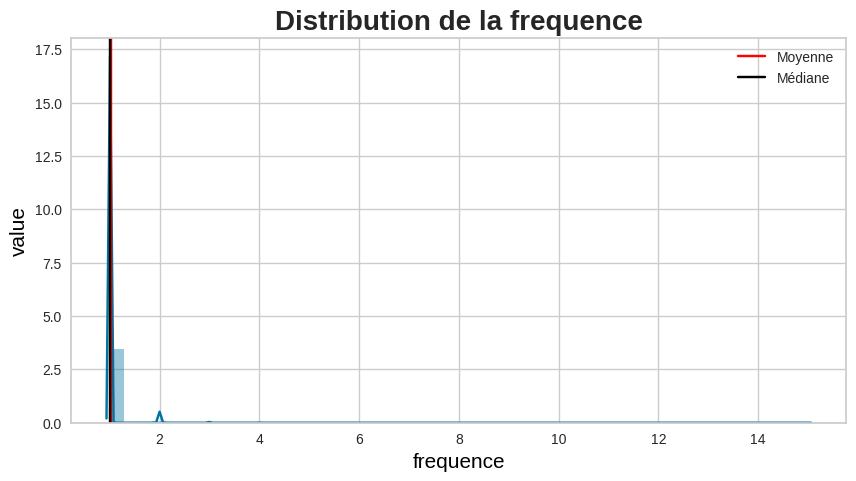

moyenne de la frequence:  1.0334197390689603
médiane de la  frequence:  1.0
asymétrei de la frequence:  11.09515629523933


In [147]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.frequence)
plt.axvline(rfm.frequence.mean(), c = 'red', label='Moyenne')
plt.axvline(rfm.frequence.median(), c = 'black', label='Médiane')
plt.title('Distribution de la frequence',fontweight='bold',fontsize=20)
plt.xlabel('frequence',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.legend()
plt.show()
print('moyenne de la frequence: ', rfm.frequence.mean())
print('médiane de la  frequence: ', rfm.frequence.median())
print('asymétrei de la frequence: ', rfm.frequence.skew())


In [148]:
rfm.frequence.describe()

count    93358.000000
mean         1.033420
std          0.209097
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         15.000000
Name: frequence, dtype: float64

* nous allons écarter le premier et le dernier quartile afin de centrer nos observations sans les valeurs "extrêmes"

In [149]:
Q1 = np.quantile(rfm.frequence, 0.25)
Q3 = np.quantile(rfm.frequence, 0.75)
frequence_Distrib = rfm[~((rfm.frequence < Q1) | (rfm.frequence > Q3))]
frequence_Distrib.head()

,customer_unique_id,recence,frequence,montant
0,0,111,1,141.90
1,1,114,1,27.19
2,2,537,1,86.22
3,3,321,1,43.62
4,4,288,1,196.89


/tmp/ipykernel_142770/2722621451.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(frequence_Distrib.frequence)
/home/stephanie/miniconda3/envs/venv/lib/python3.12/site-packages/seaborn/distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


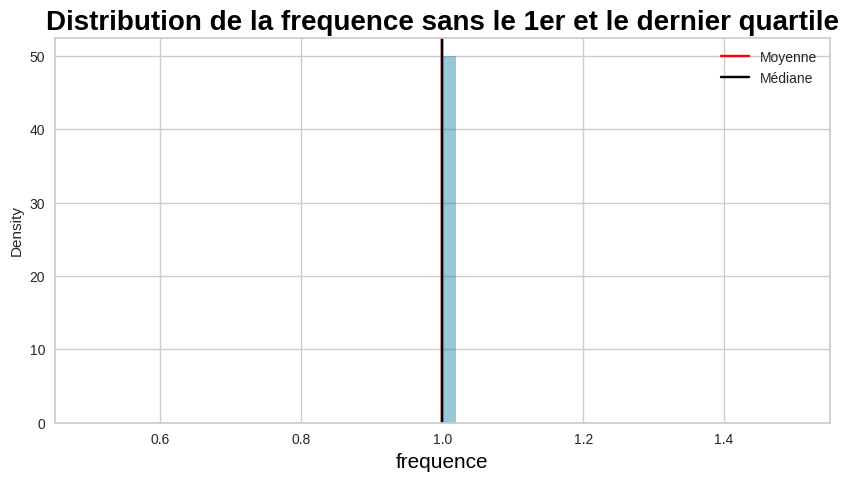

In [150]:
plt.figure(figsize=(10, 5))
sns.distplot(frequence_Distrib.frequence)
plt.axvline(frequence_Distrib.frequence.mean(), c = 'red', label='Moyenne')
plt.axvline(frequence_Distrib.frequence.median(), c = 'black', label='Médiane')
plt.xlabel('frequence',color='black',fontsize=15)
plt.legend()
plt.title('Distribution de la frequence sans le 1er et le dernier quartile',color='black',fontsize=20,fontweight='bold')
plt.show()

In [151]:
frequence_Distrib.frequence.describe()


count    90557.0
mean         1.0
std          0.0
min          1.0
25%          1.0
50%          1.0
75%          1.0
max          1.0
Name: frequence, dtype: float64

* Même en retirant les valeurs "extrêmes" de notre analyse, la fréquence a un écart-type de 0, c'est-à-dire que toutes les valeurs sont égales à 1.
* La fréquence n'est donc d'aucune utilité pour notre analyse et pour segmenter les clients.

## RFM Analyse Montant

/tmp/ipykernel_142770/501676177.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(rfm.montant)


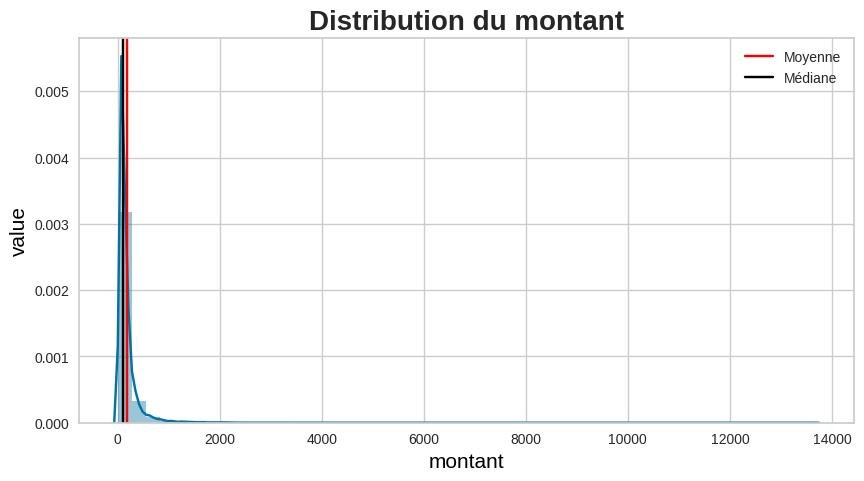

moyenne du montant:  173.40537747166823
médiane du montant:  110.60000000000001
asymétrei du montant:  11.117629998356612


In [152]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.montant)
plt.axvline(rfm.montant.mean(), c = 'red', label='Moyenne')
plt.axvline(rfm.montant.median(), c = 'black', label='Médiane')
plt.title('Distribution du montant',fontweight='bold',fontsize=20)
plt.xlabel('montant',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.legend()
plt.show()
print('moyenne du montant: ', rfm.montant.mean())
print('médiane du montant: ', rfm.montant.median())
print('asymétrei du montant: ', rfm.montant.skew())

In [153]:
rfm.montant.describe()

count    93358.000000
mean       173.405377
std        259.398971
min         10.070000
25%         64.000000
50%        110.600000
75%        188.400000
max      13664.080000
Name: montant, dtype: float64

* nous allons écarter la partie la plus haute du dernier quartile afin de centrer nos observations sans les valeurs maximales les plus "extrêmes"

In [154]:
Q1 = np.quantile(rfm.montant, 0.25)
Q3 = np.quantile(rfm.montant, 0.75)
IQR = Q3 - Q1
montantDistribution = rfm[~((rfm.montant > Q3 + (1.5 * IQR)))]
montantDistribution.head()

,customer_unique_id,recence,frequence,montant
0,0,111,1,141.90
1,1,114,1,27.19
2,2,537,1,86.22
3,3,321,1,43.62
4,4,288,1,196.89


/tmp/ipykernel_142770/2832616715.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(montantDistribution.montant)


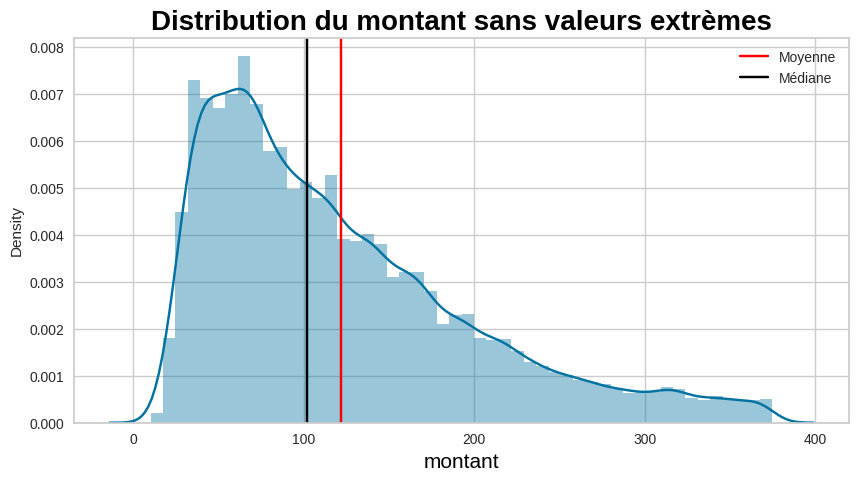

moyenne du montant sans valeurs extrèmes:  121.61947238434745
médiane du montant sans valeurs extrèmes:  101.82
asymétrei du montant sans valeurs extrèmes:  1.074739425583199


In [155]:
plt.figure(figsize=(10, 5))
sns.distplot(montantDistribution.montant)
plt.axvline(montantDistribution.montant.mean(), c = 'red', label='Moyenne')
plt.axvline(montantDistribution.montant.median(), c = 'black', label='Médiane')
plt.xlabel('montant',color='black',fontsize=15)
plt.legend()
plt.title('Distribution du montant sans valeurs extrèmes',color='black',fontsize=20,fontweight='bold')
plt.show()
print('moyenne du montant sans valeurs extrèmes: ', montantDistribution.montant.mean())
print('médiane du montant sans valeurs extrèmes: ', montantDistribution.montant.median())
print('asymétrei du montant sans valeurs extrèmes: ', montantDistribution.montant.skew())

* la distribution du montant sans valeurs extrèmes est asymétrique positive :
    - asymétrique car skewness=1,07 > 0
    - moyenne supérieure à la médiane 
* la moyenne du montant sans valeurs extrèmes est peu représentative des données, car encore trop influencée par les valeurs extrèmes. la médiane est donc une meilleure mesure de tendance centrale


In [156]:
montantDistribution.montant.describe()

count    85839.000000
mean       121.619472
std         78.478600
min         10.070000
25%         61.050000
50%        101.820000
75%        163.680000
max        375.000000
Name: montant, dtype: float64

* La valeur monétaire moyenne après traitement des valeurs extrêmes est de 122 real brésiliens, tandis que la valeur médiane est de 102 real brésiliens.
* Les 50 % de valeurs intermédiaires se situent entre 61 et 164 real brésiliens.

# SEGMENTATION RFM

##les groupes de récences

* Explication des groupes de récence :

1 - Il s'agit des clients dont la date de visite est la plus récente. (Valeur de récence inférieure ou égale au premier quartile)

2 - Il s'agit des clients dont la ou les dates de visite ne sont pas très récentes. (Valeur de récence comprise entre le 1er quantile et le deuxième quantile)

3 - Il s'agit des clients dont la date de visite est assez récente. (Valeur de récence comprise entre le deuxième quartile et le troisième quartile)

4 - Il s'agit des clients dont les dates de visite sont les plus anciennes (valeur de récence strictement supérieure au troisième quartile).

In [157]:
ll_r = rfm.recence.quantile(0.25)
mid_r = rfm.recence.quantile(0.50)
ul_r = rfm.recence.quantile(0.75)
print(ll_r, mid_r, ul_r)

114.0 218.0 346.0


In [158]:
rfm['groupes_recence'] = [1 if recent <= ll_r else 2 if ll_r < recent <= mid_r else 3 if mid_r < recent <= ul_r else 4 for recent in rfm['recence']]
rfm.head()

,customer_unique_id,recence,frequence,montant,groupes_recence
0,0,111,1,141.90,1
1,1,114,1,27.19,1
2,2,537,1,86.22,4
3,3,321,1,43.62,3
4,4,288,1,196.89,3


## les groupes de montant total de commandes

* Explication des groupes de montant total de commandes :

1 - Ce sont les clients qui dépensent beaucoup.  (Valeur monétaire strictement supérieure au troisième quartile). 

2 - Il s'agit des clients qui dépensent un bon montant. (Valeur monétaire comprise entre le deuxième quartile et le troisième quartile)

3 - Il s'agit des clients qui dépensent modérément.  (Valeur monétaire comprise entre le 1er quantile et le deuxième quantile)

4 - Ce sont les clients qui dépensent le moins. (Valeur monétaire inférieure ou égale au premier quartile)

In [159]:
ll_m = rfm.montant.quantile(0.25)
mid_m = rfm.montant.quantile(0.50)
ul_m = rfm.montant.quantile(0.75)
print(ll_m, mid_m, ul_m)

64.0 110.60000000000001 188.4


In [160]:
rfm['groupes_montant'] = [ 4 if montant <= ll_m else 3 if ll_m < montant <= mid_m else 2 if mid_m < montant <= ul_m else 1 for montant in rfm['montant']]
rfm.head()

,customer_unique_id,recence,frequence,montant,groupes_recence,groupes_montant
0,0,111,1,141.90,1,2
1,1,114,1,27.19,1,4
2,2,537,1,86.22,4,3
3,3,321,1,43.62,3,4
4,4,288,1,196.89,3,1


In [161]:
rfm.montant.mean()

173.40537747166823

## les groupes de fréquence d'achat

In [162]:
rfm.frequence.value_counts()

frequence
1     90557
2      2573
3       181
4        28
5         9
6         5
7         3
9         1
15        1
Name: count, dtype: int64

* Explication des groupes de fréquence :

1 - Il s'agit des clients qui ont passé plus de 3 commandes, les plus rares. (Fréquence > 3)

2 - Il s'agit des clients qui ont passé 3 commandes, les seconds plus rares. (Fréquence = 3)

3 - Il s'agit des clients qui ont passé 2 commandes, ils sont assez nombreux. (Fréquence = 2)

4 - Il s'agit des clients qui ont passé 1 commande, les plus nombreux. (Fréquence = 1)

In [163]:
rfm['groupes_frequence'] = [4 if freq == 1 else 3 if freq == 2 else 2 if freq == 3 else 1 for freq in rfm['frequence']]
rfm.head()

,customer_unique_id,recence,frequence,montant,groupes_recence,groupes_montant,groupes_frequence
0,0,111,1,141.90,1,2,4
1,1,114,1,27.19,1,4,4
2,2,537,1,86.22,4,3,4
3,3,321,1,43.62,3,4,4
4,4,288,1,196.89,3,1,4


In [164]:
rfm['rang'] = list(zip(rfm.groupes_recence, rfm.groupes_montant, rfm.groupes_frequence))
rfm.head()

,customer_unique_id,recence,frequence,montant,groupes_recence,groupes_montant,groupes_frequence,rang
0,0,111,1,141.90,1,2,4,"(1, 2, 4)"
1,1,114,1,27.19,1,4,4,"(1, 4, 4)"
2,2,537,1,86.22,4,3,4,"(4, 3, 4)"
3,3,321,1,43.62,3,4,4,"(3, 4, 4)"
4,4,288,1,196.89,3,1,4,"(3, 1, 4)"


In [165]:
rfm.groupes_recence.value_counts()

groupes_recence
1    23551
3    23409
4    23269
2    23129
Name: count, dtype: int64

In [166]:
rfm.groupes_frequence.value_counts()

groupes_frequence
4    90557
3     2573
2      181
1       47
Name: count, dtype: int64

In [167]:
rfm.groupes_montant.value_counts()

groupes_montant
4    23388
2    23338
1    23338
3    23294
Name: count, dtype: int64

* puisque le groupe de fréquence 4 (les clients qui n'ont passé qu'une commande) est la classe de fréquence d'achat la plus représentée et de loin, nous n'utilserons que les groupes de récence et de montant pour la segmentation client

In [168]:
rfm['rang_rec_mont'] = list(zip(rfm.groupes_recence, rfm.groupes_montant))
rfm.head()

,customer_unique_id,recence,frequence,montant,groupes_recence,groupes_montant,groupes_frequence,rang,rang_rec_mont
0,0,111,1,141.90,1,2,4,"(1, 2, 4)","(1, 2)"
1,1,114,1,27.19,1,4,4,"(1, 4, 4)","(1, 4)"
2,2,537,1,86.22,4,3,4,"(4, 3, 4)","(4, 3)"
3,3,321,1,43.62,3,4,4,"(3, 4, 4)","(3, 4)"
4,4,288,1,196.89,3,1,4,"(3, 1, 4)","(3, 1)"


In [169]:
rfm.rang_rec_mont.value_counts()


rang_rec_mont
(1, 2)    6024
(4, 3)    6000
(1, 1)    5981
(3, 3)    5976
(4, 4)    5929
(3, 2)    5876
(2, 2)    5867
(1, 4)    5858
(2, 4)    5819
(2, 1)    5813
(3, 4)    5782
(3, 1)    5775
(4, 1)    5769
(1, 3)    5688
(2, 3)    5630
(4, 2)    5571
Name: count, dtype: int64

En considérant que le rang de récence est plus important que le rang monétaire, nous allons établir les groupes comme suit:


* Les rangs les plus importants :

(Récence - 1, Monétaire - 1) - Groupe A - Ils sont très récents et ont dépensé les plus grosses sommes d'argent 

(Récence - 1, Monétaire - 2) - Groupe B - Ils sont très récents et ont dépensé une grosse somme d'argent

(Recency - 2, Monetary - 1) - Groupe C - ils sont récents et ont dépensé les plus grosses sommes d'argent

(Récence - 2, Monétaire - 2) - Groupe D - Ils sont récents et ont dépensé une grosse somme d'argent

(Récence - 1, Monétaire - 3) - Groupe E - Ils sont très récents et ont dépensé une somme d'argent convenable

* Les rangs les moins importants :

(Récence - 3, Monétaire - 3) - Groupe V - Ils sont peu anciens et ont dépensé une somme d'argent convenable

(Récence - 4, Monétaire - 2) - Groupe W - Ils sont les plus anciens et ont dépensé une grosse somme d'argent

(Récence - 3, Monétaire - 4) - Groupe X - Ils sont peu anciens et ont dépensé une quantité négligeable d'argent

(Récence - 4, Monétaire - 3) - Groupe Y - Ils sont les plus anciens et ont dépensé une somme d'argent convenable

(Récence - 4, Monétaire - 4) - Groupe Z - Ils sont les plus anciens et ont dépensé une quantité négligeable d'argent






In [170]:
# définir les groupes d'importance client
def get_group(row):
    if row['groupes_recence'] == 1:
        if row['groupes_montant'] == 1:
            return 'Clients Très Importants' # Groupe A - Ils sont très récents et ont dépensé les plus grosses sommes d'argent 
        elif row['groupes_montant'] == 2:
            return 'Clients Très Importants' # Groupe B - Ils sont très récents et ont dépensé une grosse somme d'argent
        elif row['groupes_montant'] == 3:
            return 'Clients Importants'# Groupe E - Ils sont très récents et ont dépensé une somme d'argent convenable
    elif row['groupes_recence'] == 2:
        if row['groupes_montant'] == 1: 
            return 'Clients Très Importants' #  Groupe C - ils sont récents et ont dépensé les plus grosses sommes d'argent
        elif row['groupes_montant'] == 2:
            return 'Clients Importants' #  Groupe D - Ils sont récents et ont dépensé une grosse somme d'argent
    elif row['groupes_recence'] == 3:
        if row['groupes_montant'] == 3:
            return 'Clients Moins Importants' # Groupe V - Ils sont peu anciens et ont dépensé une somme d'argent convenable
        elif row['groupes_montant'] == 4:
            return 'Clients Très Peu Importants' # Groupe X - Ils sont peu anciens et ont dépensé une quantité négligeable d'argent
    elif row['groupes_recence'] == 4:
        if row['groupes_montant'] == 4:
            return 'Clients Très Peu Importants' # Groupe Z - Ils sont les plus anciens et ont dépensé une quantité négligeable d'argent
        elif row['groupes_montant'] == 3:
            return 'Clients Très Peu Importants' # Groupe Y - Ils sont les plus anciens et ont dépensé une somme d'argent convenable
        elif row['groupes_montant'] == 2:
            return 'Clients Moins Importants' # Groupe W - Ils sont les plus anciens et ont dépensé une grosse somme d'argent
    return 'Clients Moyens - Potentiels Importants'



In [171]:
# ajouter les groupes d'importance client
rfm['groupes_importance'] = rfm.apply(get_group, axis=1)

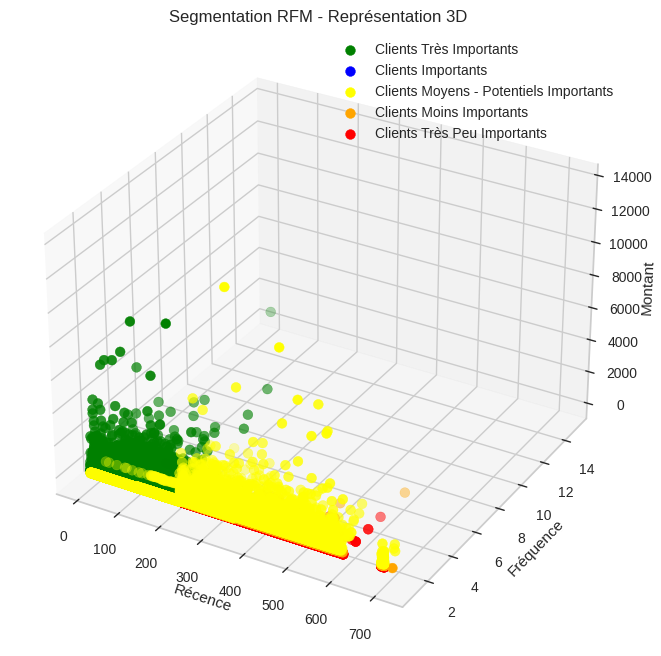

In [172]:
# graphique 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

colors = {
    'Clients Très Importants': 'green',
    'Clients Importants': 'blue',
    'Clients Moyens - Potentiels Importants': 'yellow',
    'Clients Moins Importants': 'orange',
    'Clients Très Peu Importants': 'red'
}

for group in colors.keys():
    subset = rfm[rfm['groupes_importance'] == group]
    ax.scatter(subset['recence'], subset['frequence'], subset['montant'], c=colors[group], label=group, s=50)

ax.set_xlabel('Récence')
ax.set_ylabel('Fréquence')
ax.set_zlabel('Montant')
ax.set_title('Segmentation RFM - Représentation 3D')
ax.legend()

plt.show()

In [173]:
# graphique 3D interactif 
fig = px.scatter_3d(rfm, x='recence', y='frequence', z='montant', color='groupes_importance',
                    title='Segmentation RFM - Représentation 3D Interactive',
                    labels={'recence': 'Récence', 'frequence': 'Fréquence', 'montant': 'Montant'},
                    color_discrete_map={
                        'Clients Très Importants': 'green',
                        'Clients Importants': 'blue',
                        'Clients Moyens - Potentiels Importants' : 'yellow',
                        'Clients Moins Importants': 'orange',
                        'Clients Très Peu Importants': 'red'
                    },
                    category_orders={ #légende ordonnée
                        'groupes_importance': [
                            'Clients Très Importants',
                            'Clients Importants',
                            'Clients Moyens - Potentiels Importants',
                            'Clients Moins Importants',
                            'Clients Très Peu Importants'
                        ]
                    })  
# taille des points
fig.update_traces(marker=dict(size=4))  
fig.show()

## Scoree de silhouette segmentation RFM

In [174]:
# récupérer les valeurs des 3 variables utilisées pour créés la segmentation
X = rfm[['recence', 'frequence', 'montant']].values

# encodage des étiquettes des groupes clients pour le calcul du score de silhouette
groupes_importance_encoded = rfm['groupes_importance'].astype('category').cat.codes

# score de silhouette
silhouette_avg = silhouette_score(X, groupes_importance_encoded)

print(f"Le score de silhouette moyen pour une segemntation basée sur la récense, le montant et la fréquence est : {silhouette_avg:.3f}")

Le score de silhouette moyen pour une segemntation basée sur la récense, le montant et la fréquence est : -0.086


## Conclusion Segmentation RFM

- grâce aux représentatations 3D des groupes de clients et le score de silhouette de valeur négatif, on peut conclure que les clusters ne sont pas bien séparés, il y a un chevauchement signicatif entre eux, une imbrication des groupes.
- cette segmentation RFM "classique", basée sur les quantiles, ne parvient pas à déterminer des groupes homogènes de clients, elle ne semble pas très pertinente.
- dans le notebook suivant, nous allons testé l'approche du ML, avec différents algorithmes de clustering.
